In [4]:
from keras.applications.xception import Xception, preprocess_input, decode_predictions
from lime import lime_image
from lime import submodular_pick
from skimage.segmentation import mark_boundaries
from keras.utils import load_img, img_to_array
from imutils import paths
import lime
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as c_map

C:\Users\nicol\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [76]:
def load_and_preprocess(image_path, image_size):
    img = load_img(image_path, target_size = image_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis = 0)
    img = img / 255.0

    return img

In [77]:
imagePath = "../images/cat.jpg"
imageSize = (299, 299, 3)

cat = load_and_preprocess(imagePath, imageSize)

1/1 [==============================] - 1s 1s/step


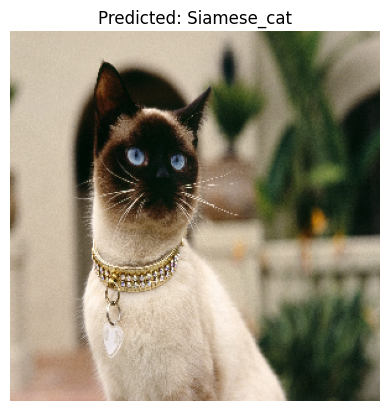

In [78]:
network = Xception(weights = "imagenet")

predictions_cat = network.predict(cat)
# Getting class with highest predicted probability
decode_cat = decode_predictions(predictions_cat, top = 5)[0]

plt.imshow(cat[0])
plt.axis("off")
plt.title("Predicted: {}".format(decode_cat[0][1]))
plt.show()

In [45]:
for c in decode_cat:
    print(c[1])

Siamese_cat
Egyptian_cat
cougar
lynx
window_screen


1st prediction correct but last has nothing to do with reality.   
1st possibility: very low score for 5th predicted class -> prediction not relevant.   
2nd possibility: wrong ROI that might lead to false predictions, unlikely as first 4 predictions correct -> LIME will help

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 2s 2s/step


  2%|▏         | 16/1000 [00:02<02:03,  7.97it/s]

1/1 [==============================] - 2s 2s/step


  2%|▎         | 25/1000 [00:04<02:41,  6.04it/s]

1/1 [==============================] - 2s 2s/step


  4%|▎         | 36/1000 [00:06<02:43,  5.88it/s]

1/1 [==============================] - 2s 2s/step


  5%|▍         | 48/1000 [00:09<02:29,  6.36it/s]

1/1 [==============================] - 2s 2s/step


  6%|▌         | 55/1000 [00:12<03:40,  4.28it/s]

1/1 [==============================] - 2s 2s/step


  6%|▋         | 64/1000 [00:14<03:43,  4.18it/s]

1/1 [==============================] - 2s 2s/step


  8%|▊         | 78/1000 [00:17<02:40,  5.73it/s]

1/1 [==============================] - 2s 2s/step


  9%|▊         | 86/1000 [00:19<03:15,  4.66it/s]

1/1 [==============================] - 2s 2s/step


 10%|▉         | 95/1000 [00:22<03:33,  4.24it/s]

1/1 [==============================] - 2s 2s/step


 10%|█         | 105/1000 [00:25<03:16,  4.57it/s]

1/1 [==============================] - 2s 2s/step


 12%|█▏        | 115/1000 [00:27<03:16,  4.50it/s]

1/1 [==============================] - 2s 2s/step


 13%|█▎        | 128/1000 [00:30<02:34,  5.63it/s]

1/1 [==============================] - 2s 2s/step


 14%|█▎        | 135/1000 [00:33<03:24,  4.23it/s]

1/1 [==============================] - 2s 2s/step


 14%|█▍        | 144/1000 [00:35<03:29,  4.09it/s]

1/1 [==============================] - 2s 2s/step


 16%|█▌        | 158/1000 [00:38<02:25,  5.80it/s]

1/1 [==============================] - 2s 2s/step


 17%|█▋        | 166/1000 [00:41<03:01,  4.59it/s]

1/1 [==============================] - 2s 2s/step


 17%|█▋        | 174/1000 [00:43<03:19,  4.15it/s]

1/1 [==============================] - 2s 2s/step


 19%|█▉        | 188/1000 [00:46<02:22,  5.69it/s]

1/1 [==============================] - 2s 2s/step


 20%|█▉        | 196/1000 [00:48<02:55,  4.58it/s]

1/1 [==============================] - 2s 2s/step


 20%|██        | 204/1000 [00:51<03:18,  4.02it/s]

1/1 [==============================] - 2s 2s/step


 21%|██▏       | 214/1000 [00:54<03:04,  4.27it/s]

1/1 [==============================] - 2s 2s/step


 22%|██▏       | 224/1000 [00:56<03:02,  4.26it/s]

1/1 [==============================] - 2s 2s/step


 24%|██▎       | 236/1000 [00:59<02:38,  4.83it/s]

1/1 [==============================] - 2s 2s/step


 25%|██▍       | 249/1000 [01:02<02:04,  6.01it/s]

1/1 [==============================] - 2s 2s/step


 26%|██▌       | 256/1000 [01:04<02:55,  4.23it/s]

1/1 [==============================] - 2s 2s/step


 26%|██▋       | 265/1000 [01:07<02:59,  4.09it/s]

1/1 [==============================] - 2s 2s/step


 28%|██▊       | 277/1000 [01:10<02:20,  5.16it/s]

1/1 [==============================] - 2s 2s/step


 29%|██▉       | 288/1000 [01:12<02:03,  5.78it/s]

1/1 [==============================] - 2s 2s/step


 30%|██▉       | 295/1000 [01:15<02:44,  4.28it/s]

1/1 [==============================] - 2s 2s/step


 31%|███       | 308/1000 [01:18<02:01,  5.69it/s]

1/1 [==============================] - 2s 2s/step


 32%|███▏      | 315/1000 [01:20<02:38,  4.31it/s]

1/1 [==============================] - 2s 2s/step


 32%|███▏      | 324/1000 [01:23<02:42,  4.17it/s]

1/1 [==============================] - 2s 2s/step


 34%|███▎      | 335/1000 [01:25<02:26,  4.53it/s]

1/1 [==============================] - 2s 2s/step


 34%|███▍      | 344/1000 [01:28<02:31,  4.33it/s]

1/1 [==============================] - 2s 2s/step


 35%|███▌      | 354/1000 [01:31<02:30,  4.29it/s]

1/1 [==============================] - 2s 2s/step


 36%|███▋      | 364/1000 [01:33<02:25,  4.38it/s]

1/1 [==============================] - 2s 2s/step


 38%|███▊      | 379/1000 [01:36<01:45,  5.88it/s]

1/1 [==============================] - 3s 3s/step


 39%|███▊      | 387/1000 [01:39<02:33,  3.99it/s]

1/1 [==============================] - 3s 3s/step


 40%|███▉      | 398/1000 [01:43<02:18,  4.34it/s]

1/1 [==============================] - 3s 3s/step


 41%|████      | 406/1000 [01:47<02:54,  3.41it/s]

1/1 [==============================] - 3s 3s/step


 41%|████▏     | 414/1000 [01:50<03:14,  3.02it/s]

1/1 [==============================] - 2s 2s/step


 43%|████▎     | 429/1000 [01:53<01:48,  5.25it/s]

1/1 [==============================] - 3s 3s/step


 44%|████▎     | 436/1000 [01:57<02:44,  3.42it/s]

1/1 [==============================] - 3s 3s/step


 44%|████▍     | 445/1000 [02:00<02:45,  3.35it/s]

1/1 [==============================] - 3s 3s/step


 46%|████▌     | 455/1000 [02:03<02:24,  3.77it/s]

1/1 [==============================] - 2s 2s/step


 47%|████▋     | 469/1000 [02:06<01:38,  5.38it/s]

1/1 [==============================] - 4s 4s/step


 48%|████▊     | 475/1000 [02:10<03:03,  2.87it/s]

1/1 [==============================] - 4s 4s/step


 49%|████▊     | 487/1000 [02:15<02:20,  3.64it/s]

1/1 [==============================] - 5s 5s/step


 50%|████▉     | 497/1000 [02:20<02:43,  3.08it/s]

1/1 [==============================] - 4s 4s/step


 51%|█████     | 506/1000 [02:24<02:46,  2.97it/s]

1/1 [==============================] - 3s 3s/step


 51%|█████▏    | 514/1000 [02:27<02:40,  3.02it/s]

1/1 [==============================] - 4s 4s/step


 53%|█████▎    | 528/1000 [02:32<01:55,  4.08it/s]

1/1 [==============================] - 3s 3s/step


 54%|█████▎    | 536/1000 [02:34<02:02,  3.78it/s]

1/1 [==============================] - 2s 2s/step


 55%|█████▍    | 545/1000 [02:37<01:51,  4.08it/s]

1/1 [==============================] - 2s 2s/step


 56%|█████▌    | 555/1000 [02:40<01:46,  4.19it/s]

1/1 [==============================] - 2s 2s/step


 57%|█████▋    | 566/1000 [02:42<01:30,  4.77it/s]

1/1 [==============================] - 3s 3s/step


 58%|█████▊    | 576/1000 [02:45<01:36,  4.38it/s]

1/1 [==============================] - 2s 2s/step


 59%|█████▊    | 586/1000 [02:48<01:32,  4.49it/s]

1/1 [==============================] - 3s 3s/step


 60%|█████▉    | 595/1000 [02:51<01:38,  4.13it/s]

1/1 [==============================] - 3s 3s/step


 61%|██████    | 606/1000 [02:55<01:36,  4.09it/s]

1/1 [==============================] - 3s 3s/step


 62%|██████▏   | 618/1000 [02:58<01:15,  5.09it/s]

1/1 [==============================] - 3s 3s/step


 63%|██████▎   | 626/1000 [03:00<01:29,  4.20it/s]

1/1 [==============================] - 2s 2s/step


 63%|██████▎   | 634/1000 [03:03<01:35,  3.84it/s]

1/1 [==============================] - 3s 3s/step


 65%|██████▍   | 646/1000 [03:06<01:26,  4.08it/s]

1/1 [==============================] - 2s 2s/step


 66%|██████▌   | 659/1000 [03:09<01:01,  5.58it/s]

1/1 [==============================] - 3s 3s/step


 67%|██████▋   | 668/1000 [03:13<01:21,  4.09it/s]

1/1 [==============================] - 3s 3s/step


 68%|██████▊   | 676/1000 [03:16<01:33,  3.47it/s]

1/1 [==============================] - 3s 3s/step


 69%|██████▉   | 689/1000 [03:20<01:04,  4.79it/s]

1/1 [==============================] - 4s 4s/step


 69%|██████▉   | 694/1000 [03:25<02:19,  2.20it/s]

1/1 [==============================] - 3s 3s/step


 71%|███████   | 709/1000 [03:29<01:05,  4.47it/s]

1/1 [==============================] - 3s 3s/step


 72%|███████▏  | 718/1000 [03:32<01:09,  4.06it/s]

1/1 [==============================] - 3s 3s/step


 73%|███████▎  | 726/1000 [03:35<01:14,  3.69it/s]

1/1 [==============================] - 3s 3s/step


 74%|███████▍  | 738/1000 [03:39<00:55,  4.75it/s]

1/1 [==============================] - 3s 3s/step


 75%|███████▍  | 749/1000 [03:42<00:58,  4.31it/s]

1/1 [==============================] - 3s 3s/step


 76%|███████▌  | 757/1000 [03:45<01:03,  3.82it/s]

1/1 [==============================] - 4s 4s/step


 77%|███████▋  | 768/1000 [03:49<00:59,  3.90it/s]

1/1 [==============================] - 4s 4s/step


 78%|███████▊  | 778/1000 [03:54<01:05,  3.36it/s]

1/1 [==============================] - 6s 6s/step


 79%|███████▊  | 786/1000 [04:00<01:39,  2.15it/s]

1/1 [==============================] - 4s 4s/step


 80%|███████▉  | 799/1000 [04:05<01:04,  3.10it/s]

1/1 [==============================] - 3s 3s/step


 81%|████████  | 807/1000 [04:09<01:07,  2.87it/s]

1/1 [==============================] - 3s 3s/step


 82%|████████▏ | 816/1000 [04:12<00:55,  3.30it/s]

1/1 [==============================] - 2s 2s/step


 83%|████████▎ | 826/1000 [04:14<00:44,  3.90it/s]

1/1 [==============================] - 3s 3s/step


 84%|████████▎ | 837/1000 [04:17<00:37,  4.36it/s]

1/1 [==============================] - 3s 3s/step


 85%|████████▍ | 848/1000 [04:20<00:32,  4.64it/s]

1/1 [==============================] - 3s 3s/step


 86%|████████▌ | 858/1000 [04:24<00:36,  3.90it/s]

1/1 [==============================] - 3s 3s/step


 87%|████████▋ | 867/1000 [04:27<00:36,  3.66it/s]

1/1 [==============================] - 3s 3s/step


 88%|████████▊ | 878/1000 [04:31<00:31,  3.90it/s]

1/1 [==============================] - 3s 3s/step


 88%|████████▊ | 885/1000 [04:34<00:35,  3.25it/s]

1/1 [==============================] - 3s 3s/step


 90%|████████▉ | 898/1000 [04:37<00:22,  4.50it/s]

1/1 [==============================] - 3s 3s/step


 91%|█████████ | 907/1000 [04:40<00:22,  4.22it/s]

1/1 [==============================] - 2s 2s/step


 92%|█████████▏| 915/1000 [04:43<00:21,  3.96it/s]

1/1 [==============================] - 2s 2s/step


 93%|█████████▎| 926/1000 [04:46<00:16,  4.49it/s]

1/1 [==============================] - 2s 2s/step


 94%|█████████▎| 936/1000 [04:48<00:14,  4.57it/s]

1/1 [==============================] - 2s 2s/step


 95%|█████████▍| 947/1000 [04:51<00:11,  4.81it/s]

1/1 [==============================] - 3s 3s/step


 96%|█████████▌| 958/1000 [04:54<00:08,  4.77it/s]

1/1 [==============================] - 3s 3s/step


 96%|█████████▋| 965/1000 [04:57<00:09,  3.80it/s]

1/1 [==============================] - 3s 3s/step


 98%|█████████▊| 977/1000 [05:00<00:05,  4.34it/s]

1/1 [==============================] - 2s 2s/step


 99%|█████████▊| 987/1000 [05:02<00:02,  4.52it/s]

1/1 [==============================] - 2s 2s/step


100%|█████████▉| 999/1000 [05:05<00:00,  5.24it/s]

1/1 [==============================] - 2s 2s/step


100%|██████████| 1000/1000 [05:07<00:00,  3.25it/s]


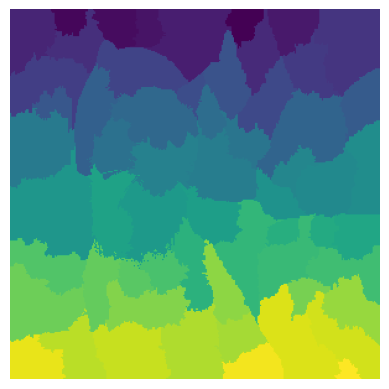

In [79]:
# Interpreting results with LIME
explainer = lime_image.LimeImageExplainer()
exp_cat = explainer.explain_instance(cat[0], network.predict, top_labels = 5,
                                  hide_color = 0, num_samples = 1000)
# Display segments meant to explain the prediction
plt.imshow(exp_cat.segments)
plt.axis("off")
plt.show()

In [31]:
# exp: explaination object obtained by exp.explain_instance
# exp_class: classes predicted by neural network, obtained by exp.top_labels()
# weight: minimum weight to consider a feature (superpixel) as having a positive effect on the prediction
# class_name: class name
# show_positive: if True, will only highlight the border of main superpixels. 
#                Default to False: all superpixel is highlighted.
# hide_background: if True, all superpixels RGB are set to (0, 0, 0) except the main ones.
#                   Default to False: other superpixels are displayed normally.
def generate_prediction_sample(exp, exp_class, weight = 0, class_name = None, 
                                show_positive = False, hide_background = False):

    image, mask = exp.get_image_and_mask(exp_class, positive_only = show_positive, 
                num_features = 6, hide_rest = hide_background, min_weight = weight)
    plt.imshow(mark_boundaries(image, mask))
    plt.axis("off")
    if class_name:
        plt.title(class_name)
    plt.show()

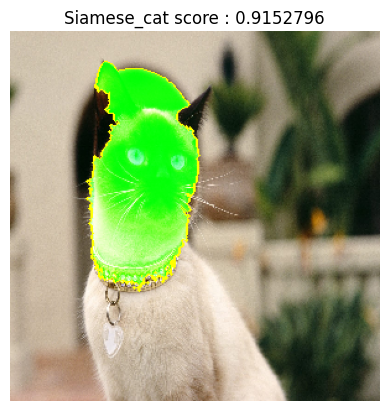

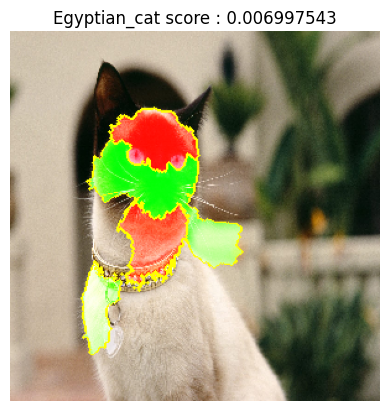

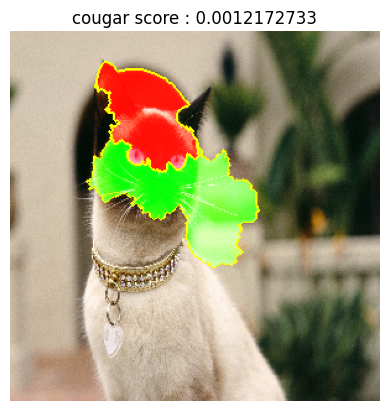

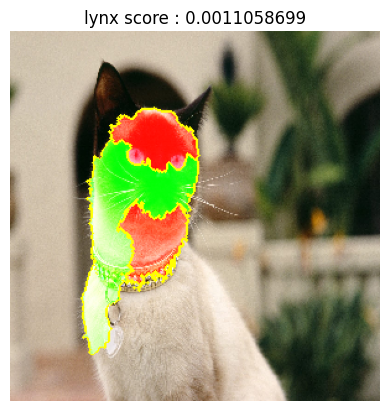

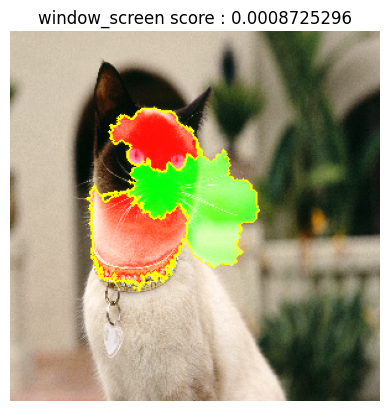

In [43]:
for i in range(len(decode_cat)):
    generate_prediction_sample(exp_cat, exp_cat.top_labels[i], 
        class_name = decode_cat[i][1] + " score : "+ decode_cat[i][2].astype("str"))

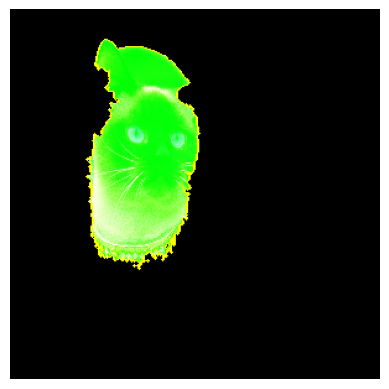

In [9]:
# Test showing results when hide_background == True
# Can be useful when explaining multiple classes and putting results in subplots
generate_prediction_sample(exp_cat, exp_cat.top_labels[0], hide_background = True)

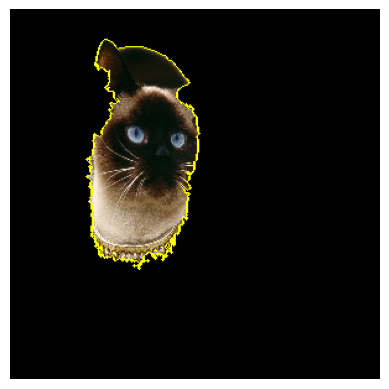

In [10]:
# Test showing results when show_positive == True
# Can be useful when original image has low contrast or its content is hard to see
generate_prediction_sample(exp_cat, exp_cat.top_labels[0], show_positive = True, hide_background = True)

ROI is the cat's head, which makes sense to discriminate a siamese cat. We can conclude that ROI is, in this case, adapted to the task. Let us not forget that LIME is a local method, which means that results may differ from one input to another.   
Score of classes 2, 3, 4 and 5 is below 0.01 (1 % probability) confirming that 5th predicted class is not relevant.

In [80]:
dog = load_and_preprocess("../images/dog.jpg", imageSize)

In [81]:
exp_dog = explainer.explain_instance(dog[0], network.predict, top_labels = 5,
                                  hide_color = 0, num_samples = 1000)

  1%|          | 8/1000 [00:00<00:13, 72.01it/s]

1/1 [==============================] - 2s 2s/step


  2%|▏         | 16/1000 [00:02<02:54,  5.64it/s]

1/1 [==============================] - 2s 2s/step


  3%|▎         | 28/1000 [00:04<02:36,  6.21it/s]

1/1 [==============================] - 2s 2s/step


  3%|▎         | 33/1000 [00:07<04:05,  3.95it/s]

1/1 [==============================] - 2s 2s/step


  4%|▍         | 45/1000 [00:09<03:33,  4.47it/s]

1/1 [==============================] - 3s 3s/step


  6%|▌         | 55/1000 [00:12<03:37,  4.34it/s]

1/1 [==============================] - 3s 3s/step


  7%|▋         | 67/1000 [00:15<03:16,  4.75it/s]

1/1 [==============================] - 2s 2s/step


  8%|▊         | 77/1000 [00:18<03:18,  4.65it/s]

1/1 [==============================] - 2s 2s/step


  8%|▊         | 85/1000 [00:21<03:44,  4.08it/s]

1/1 [==============================] - 3s 3s/step


 10%|▉         | 98/1000 [00:23<03:03,  4.91it/s]

1/1 [==============================] - 2s 2s/step


 11%|█         | 108/1000 [00:26<03:08,  4.74it/s]

1/1 [==============================] - 2s 2s/step


 12%|█▏        | 118/1000 [00:29<03:10,  4.64it/s]

1/1 [==============================] - 3s 3s/step


 13%|█▎        | 128/1000 [00:32<03:19,  4.37it/s]

1/1 [==============================] - 3s 3s/step


 14%|█▍        | 138/1000 [00:35<03:20,  4.29it/s]

1/1 [==============================] - 2s 2s/step


 15%|█▍        | 149/1000 [00:37<03:03,  4.64it/s]

1/1 [==============================] - 3s 3s/step


 15%|█▌        | 153/1000 [00:40<04:34,  3.09it/s]

1/1 [==============================] - 2s 2s/step


 17%|█▋        | 166/1000 [00:43<03:21,  4.14it/s]

1/1 [==============================] - 3s 3s/step


 18%|█▊        | 175/1000 [00:46<03:25,  4.01it/s]

1/1 [==============================] - 2s 2s/step


 19%|█▊        | 186/1000 [00:48<03:02,  4.47it/s]

1/1 [==============================] - 2s 2s/step


 20%|█▉        | 198/1000 [00:51<02:41,  4.95it/s]

1/1 [==============================] - 2s 2s/step


 21%|██        | 208/1000 [00:54<02:44,  4.81it/s]

1/1 [==============================] - 3s 3s/step


 22%|██▏       | 218/1000 [00:57<02:54,  4.47it/s]

1/1 [==============================] - 2s 2s/step


 23%|██▎       | 229/1000 [01:00<02:43,  4.73it/s]

1/1 [==============================] - 2s 2s/step


 24%|██▍       | 238/1000 [01:02<02:54,  4.37it/s]

1/1 [==============================] - 2s 2s/step


 24%|██▍       | 242/1000 [01:05<04:05,  3.08it/s]

1/1 [==============================] - 2s 2s/step


 26%|██▌       | 258/1000 [01:08<02:36,  4.74it/s]

1/1 [==============================] - 2s 2s/step


 26%|██▌       | 262/1000 [01:10<03:42,  3.31it/s]

1/1 [==============================] - 2s 2s/step


 28%|██▊       | 275/1000 [01:13<02:51,  4.23it/s]

1/1 [==============================] - 2s 2s/step


 29%|██▊       | 286/1000 [01:15<02:36,  4.56it/s]

1/1 [==============================] - 2s 2s/step


 29%|██▉       | 294/1000 [01:18<02:48,  4.19it/s]

1/1 [==============================] - 2s 2s/step


 31%|███       | 306/1000 [01:21<02:28,  4.69it/s]

1/1 [==============================] - 2s 2s/step


 32%|███▏      | 316/1000 [01:23<02:26,  4.67it/s]

1/1 [==============================] - 2s 2s/step


 33%|███▎      | 327/1000 [01:26<02:15,  4.98it/s]

1/1 [==============================] - 2s 2s/step


 34%|███▍      | 339/1000 [01:29<02:02,  5.40it/s]

1/1 [==============================] - 2s 2s/step


 34%|███▍      | 343/1000 [01:31<03:07,  3.50it/s]

1/1 [==============================] - 2s 2s/step


 36%|███▌      | 356/1000 [01:34<02:25,  4.42it/s]

1/1 [==============================] - 2s 2s/step


 37%|███▋      | 367/1000 [01:37<02:12,  4.77it/s]

1/1 [==============================] - 2s 2s/step


 38%|███▊      | 377/1000 [01:39<02:14,  4.62it/s]

1/1 [==============================] - 2s 2s/step


 39%|███▊      | 387/1000 [01:42<02:12,  4.63it/s]

1/1 [==============================] - 2s 2s/step


 40%|███▉      | 396/1000 [01:45<02:19,  4.32it/s]

1/1 [==============================] - 2s 2s/step


 41%|████      | 407/1000 [01:47<02:05,  4.71it/s]

1/1 [==============================] - 2s 2s/step


 42%|████▏     | 417/1000 [01:50<02:04,  4.68it/s]

1/1 [==============================] - 2s 2s/step


 43%|████▎     | 427/1000 [01:53<02:01,  4.72it/s]

1/1 [==============================] - 2s 2s/step


 44%|████▎     | 437/1000 [01:55<02:01,  4.65it/s]

1/1 [==============================] - 2s 2s/step


 45%|████▍     | 447/1000 [01:58<02:00,  4.58it/s]

1/1 [==============================] - 2s 2s/step


 46%|████▌     | 456/1000 [02:01<02:04,  4.36it/s]

1/1 [==============================] - 2s 2s/step


 47%|████▋     | 467/1000 [02:04<01:53,  4.68it/s]

1/1 [==============================] - 3s 3s/step


 48%|████▊     | 475/1000 [02:07<02:24,  3.62it/s]

1/1 [==============================] - 3s 3s/step


 49%|████▊     | 486/1000 [02:10<02:09,  3.97it/s]

1/1 [==============================] - 2s 2s/step


 50%|████▉     | 495/1000 [02:13<02:05,  4.03it/s]

1/1 [==============================] - 3s 3s/step


 51%|█████     | 506/1000 [02:16<01:54,  4.31it/s]

1/1 [==============================] - 3s 3s/step


 52%|█████▏    | 516/1000 [02:18<01:51,  4.34it/s]

1/1 [==============================] - 3s 3s/step


 52%|█████▎    | 525/1000 [02:21<01:58,  4.02it/s]

1/1 [==============================] - 3s 3s/step


 54%|█████▎    | 536/1000 [02:24<01:47,  4.32it/s]

1/1 [==============================] - 3s 3s/step


 55%|█████▍    | 546/1000 [02:27<01:44,  4.33it/s]

1/1 [==============================] - 3s 3s/step


 56%|█████▌    | 556/1000 [02:30<01:43,  4.30it/s]

1/1 [==============================] - 2s 2s/step


 57%|█████▋    | 566/1000 [02:33<01:39,  4.37it/s]

1/1 [==============================] - 3s 3s/step


 58%|█████▊    | 578/1000 [02:36<01:28,  4.76it/s]

1/1 [==============================] - 2s 2s/step


 59%|█████▊    | 587/1000 [02:39<01:34,  4.37it/s]

1/1 [==============================] - 3s 3s/step


 60%|█████▉    | 597/1000 [02:41<01:33,  4.32it/s]

1/1 [==============================] - 3s 3s/step


 60%|██████    | 604/1000 [02:44<01:49,  3.62it/s]

1/1 [==============================] - 3s 3s/step


 62%|██████▏   | 615/1000 [02:47<01:37,  3.97it/s]

1/1 [==============================] - 2s 2s/step


 63%|██████▎   | 629/1000 [02:50<01:06,  5.58it/s]

1/1 [==============================] - 3s 3s/step


 64%|██████▍   | 638/1000 [02:53<01:21,  4.43it/s]

1/1 [==============================] - 3s 3s/step


 65%|██████▍   | 648/1000 [02:56<01:20,  4.39it/s]

1/1 [==============================] - 3s 3s/step


 66%|██████▌   | 658/1000 [02:59<01:18,  4.35it/s]

1/1 [==============================] - 3s 3s/step


 67%|██████▋   | 669/1000 [03:02<01:12,  4.59it/s]

1/1 [==============================] - 3s 3s/step


 68%|██████▊   | 679/1000 [03:04<01:12,  4.42it/s]

1/1 [==============================] - 3s 3s/step


 68%|██████▊   | 683/1000 [03:07<01:47,  2.95it/s]

1/1 [==============================] - 2s 2s/step


 70%|██████▉   | 695/1000 [03:10<01:20,  3.80it/s]

1/1 [==============================] - 3s 3s/step


 71%|███████   | 707/1000 [03:13<01:05,  4.48it/s]

1/1 [==============================] - 2s 2s/step


 72%|███████▏  | 718/1000 [03:15<00:58,  4.84it/s]

1/1 [==============================] - 3s 3s/step


 73%|███████▎  | 729/1000 [03:18<00:55,  4.86it/s]

1/1 [==============================] - 3s 3s/step


 73%|███████▎  | 733/1000 [03:21<01:23,  3.20it/s]

1/1 [==============================] - 2s 2s/step


 74%|███████▍  | 744/1000 [03:24<01:08,  3.76it/s]

1/1 [==============================] - 2s 2s/step


 76%|███████▌  | 758/1000 [03:27<00:49,  4.87it/s]

1/1 [==============================] - 2s 2s/step


 77%|███████▋  | 769/1000 [03:29<00:46,  4.94it/s]

1/1 [==============================] - 3s 3s/step


 78%|███████▊  | 778/1000 [03:32<00:50,  4.40it/s]

1/1 [==============================] - 3s 3s/step


 79%|███████▉  | 788/1000 [03:35<00:49,  4.31it/s]

1/1 [==============================] - 3s 3s/step


 80%|███████▉  | 796/1000 [03:38<00:53,  3.79it/s]

1/1 [==============================] - 2s 2s/step


 81%|████████  | 807/1000 [03:41<00:44,  4.38it/s]

1/1 [==============================] - 3s 3s/step


 82%|████████▏ | 818/1000 [03:44<00:39,  4.56it/s]

1/1 [==============================] - 3s 3s/step


 83%|████████▎ | 828/1000 [03:47<00:38,  4.41it/s]

1/1 [==============================] - 3s 3s/step


 84%|████████▎ | 837/1000 [03:49<00:39,  4.16it/s]

1/1 [==============================] - 3s 3s/step


 85%|████████▍ | 846/1000 [03:52<00:38,  4.04it/s]

1/1 [==============================] - 3s 3s/step


 86%|████████▌ | 856/1000 [03:55<00:35,  4.11it/s]

1/1 [==============================] - 2s 2s/step


 87%|████████▋ | 868/1000 [03:58<00:27,  4.85it/s]

1/1 [==============================] - 3s 3s/step


 88%|████████▊ | 878/1000 [04:01<00:26,  4.63it/s]

1/1 [==============================] - 3s 3s/step


 88%|████████▊ | 885/1000 [04:04<00:33,  3.40it/s]

1/1 [==============================] - 2s 2s/step


 90%|████████▉ | 898/1000 [04:07<00:22,  4.58it/s]

1/1 [==============================] - 2s 2s/step


 91%|█████████ | 909/1000 [04:09<00:18,  4.88it/s]

1/1 [==============================] - 2s 2s/step


 91%|█████████▏| 913/1000 [04:12<00:27,  3.16it/s]

1/1 [==============================] - 3s 3s/step


 93%|█████████▎| 926/1000 [04:15<00:18,  4.09it/s]

1/1 [==============================] - 3s 3s/step


 94%|█████████▎| 936/1000 [04:18<00:15,  4.18it/s]

1/1 [==============================] - 3s 3s/step


 95%|█████████▍| 946/1000 [04:21<00:12,  4.25it/s]

1/1 [==============================] - 3s 3s/step


 96%|█████████▌| 956/1000 [04:24<00:10,  4.24it/s]

1/1 [==============================] - 3s 3s/step


 97%|█████████▋| 967/1000 [04:27<00:07,  4.56it/s]

1/1 [==============================] - 2s 2s/step


 98%|█████████▊| 978/1000 [04:29<00:04,  4.75it/s]

1/1 [==============================] - 2s 2s/step


 98%|█████████▊| 982/1000 [04:32<00:05,  3.21it/s]

1/1 [==============================] - 2s 2s/step


100%|█████████▉| 996/1000 [04:35<00:00,  4.37it/s]

1/1 [==============================] - 2s 2s/step


100%|██████████| 1000/1000 [04:37<00:00,  3.60it/s]


In [82]:
predictions_dog = network.predict(dog)
decode_dog = decode_predictions(predictions_dog)[0]
for c in decode_dog:
    print(c[1])

1/1 [==============================] - 0s 205ms/step
beagle
basset
Walker_hound
English_foxhound
Cardigan


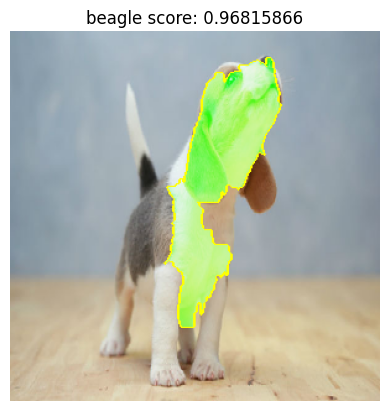

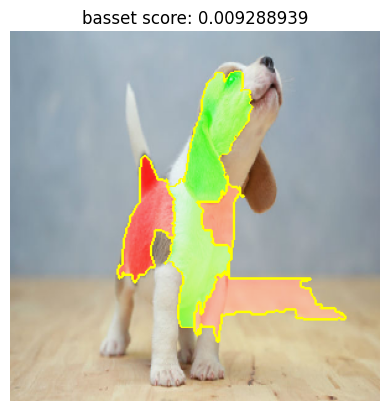

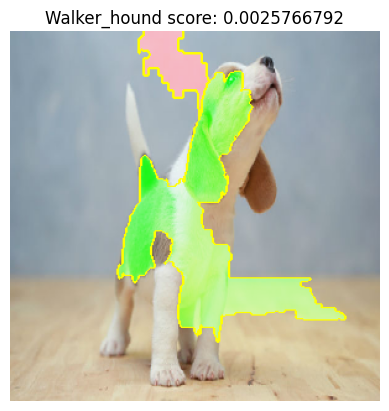

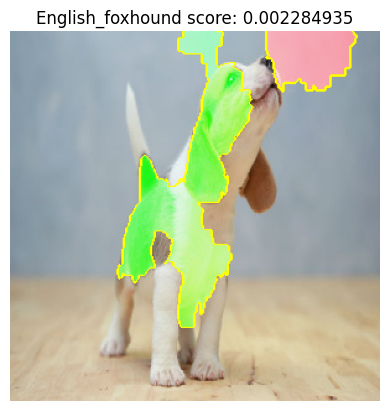

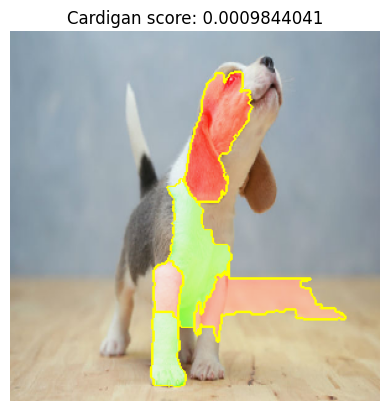

In [48]:
for i in range(len(decode_dog)):
    generate_prediction_sample(exp_dog, exp_dog.top_labels[i], 
        class_name = decode_dog[i][1] + " score: " + decode_dog[i][2].astype("str"))

In [84]:
panda = load_and_preprocess("../images/panda.jpg", imageSize)

In [85]:
predictions_panda = network.predict(panda)
decode_panda = decode_predictions(predictions_panda)[0]

1/1 [==============================] - 0s 338ms/step


In [86]:
exp_panda = explainer.explain_instance(panda[0], network.predict, top_labels = 5,
                                         hide_color = 0, num_samples = 1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 2s 2s/step


  2%|▏         | 17/1000 [00:02<02:00,  8.19it/s]

1/1 [==============================] - 2s 2s/step


  2%|▏         | 22/1000 [00:04<03:49,  4.26it/s]

1/1 [==============================] - 2s 2s/step


  4%|▍         | 39/1000 [00:07<02:29,  6.42it/s]

1/1 [==============================] - 2s 2s/step


  4%|▍         | 44/1000 [00:09<03:35,  4.43it/s]

1/1 [==============================] - 2s 2s/step


  6%|▌         | 57/1000 [00:11<02:55,  5.37it/s]

1/1 [==============================] - 2s 2s/step


  6%|▌         | 61/1000 [00:13<04:07,  3.80it/s]

1/1 [==============================] - 2s 2s/step


  8%|▊         | 77/1000 [00:16<02:56,  5.24it/s]

1/1 [==============================] - 2s 2s/step


  9%|▊         | 86/1000 [00:19<03:14,  4.70it/s]

1/1 [==============================] - 2s 2s/step


 10%|▉         | 96/1000 [00:21<03:17,  4.57it/s]

1/1 [==============================] - 3s 3s/step


 11%|█         | 106/1000 [00:25<03:31,  4.23it/s]

1/1 [==============================] - 3s 3s/step


 12%|█▏        | 116/1000 [00:28<03:38,  4.05it/s]

1/1 [==============================] - 3s 3s/step


 12%|█▎        | 125/1000 [00:31<04:04,  3.58it/s]

1/1 [==============================] - 3s 3s/step


 14%|█▎        | 135/1000 [00:34<03:52,  3.73it/s]

1/1 [==============================] - 2s 2s/step


 15%|█▍        | 147/1000 [00:37<03:04,  4.62it/s]

1/1 [==============================] - 2s 2s/step


 16%|█▌        | 157/1000 [00:39<03:00,  4.68it/s]

1/1 [==============================] - 2s 2s/step


 17%|█▋        | 167/1000 [00:42<02:55,  4.73it/s]

1/1 [==============================] - 2s 2s/step


 18%|█▊        | 176/1000 [00:45<03:04,  4.47it/s]

1/1 [==============================] - 2s 2s/step


 18%|█▊        | 184/1000 [00:47<03:15,  4.18it/s]

1/1 [==============================] - 2s 2s/step


 20%|█▉        | 196/1000 [00:50<02:52,  4.65it/s]

1/1 [==============================] - 2s 2s/step


 21%|██        | 207/1000 [00:52<02:38,  5.02it/s]

1/1 [==============================] - 2s 2s/step


 21%|██▏       | 213/1000 [00:55<03:16,  4.00it/s]

1/1 [==============================] - 2s 2s/step


 23%|██▎       | 229/1000 [00:58<02:10,  5.90it/s]

1/1 [==============================] - 3s 3s/step


 24%|██▍       | 239/1000 [01:01<02:33,  4.96it/s]

1/1 [==============================] - 2s 2s/step


 25%|██▍       | 249/1000 [01:04<02:40,  4.68it/s]

1/1 [==============================] - 3s 3s/step


 26%|██▌       | 258/1000 [01:07<02:56,  4.20it/s]

1/1 [==============================] - 3s 3s/step


 27%|██▋       | 268/1000 [01:10<02:41,  4.54it/s]

1/1 [==============================] - 3s 3s/step


 28%|██▊       | 276/1000 [01:13<03:08,  3.84it/s]

1/1 [==============================] - 2s 2s/step


 28%|██▊       | 285/1000 [01:15<02:59,  3.98it/s]

1/1 [==============================] - 2s 2s/step


 30%|██▉       | 297/1000 [01:18<02:27,  4.76it/s]

1/1 [==============================] - 3s 3s/step


 31%|███       | 306/1000 [01:21<02:45,  4.21it/s]

1/1 [==============================] - 3s 3s/step


 31%|███▏      | 314/1000 [01:24<03:04,  3.71it/s]

1/1 [==============================] - 3s 3s/step


 32%|███▎      | 325/1000 [01:27<02:49,  3.99it/s]

1/1 [==============================] - 3s 3s/step


 34%|███▎      | 336/1000 [01:30<02:37,  4.20it/s]

1/1 [==============================] - 2s 2s/step


 34%|███▍      | 344/1000 [01:33<02:52,  3.81it/s]

1/1 [==============================] - 2s 2s/step


 36%|███▌      | 355/1000 [01:35<02:30,  4.28it/s]

1/1 [==============================] - 2s 2s/step


 37%|███▋      | 367/1000 [01:38<02:11,  4.82it/s]

1/1 [==============================] - 3s 3s/step


 38%|███▊      | 377/1000 [01:41<02:22,  4.37it/s]

1/1 [==============================] - 4s 4s/step


 39%|███▊      | 386/1000 [01:46<03:06,  3.29it/s]

1/1 [==============================] - 4s 4s/step


 40%|███▉      | 395/1000 [01:50<03:26,  2.93it/s]

1/1 [==============================] - 4s 4s/step


 41%|████      | 408/1000 [01:55<02:53,  3.40it/s]

1/1 [==============================] - 5s 5s/step


 42%|████▏     | 415/1000 [02:00<04:23,  2.22it/s]

1/1 [==============================] - 4s 4s/step


 43%|████▎     | 427/1000 [02:04<03:14,  2.95it/s]

1/1 [==============================] - 5s 5s/step


 44%|████▍     | 438/1000 [02:09<02:55,  3.20it/s]

1/1 [==============================] - 3s 3s/step


 44%|████▍     | 445/1000 [02:13<03:17,  2.81it/s]

1/1 [==============================] - 3s 3s/step


 46%|████▌     | 455/1000 [02:16<02:56,  3.09it/s]

1/1 [==============================] - 3s 3s/step


 47%|████▋     | 467/1000 [02:20<02:31,  3.51it/s]

1/1 [==============================] - 3s 3s/step


 48%|████▊     | 476/1000 [02:24<02:35,  3.38it/s]

1/1 [==============================] - 3s 3s/step


 49%|████▊     | 486/1000 [02:27<02:24,  3.56it/s]

1/1 [==============================] - 3s 3s/step


 50%|████▉     | 497/1000 [02:30<02:07,  3.94it/s]

1/1 [==============================] - 3s 3s/step


 51%|█████     | 506/1000 [02:33<02:15,  3.64it/s]

1/1 [==============================] - 3s 3s/step


 51%|█████▏    | 514/1000 [02:37<02:41,  3.02it/s]

1/1 [==============================] - 3s 3s/step


 53%|█████▎    | 528/1000 [02:41<01:49,  4.31it/s]

1/1 [==============================] - 4s 4s/step


 54%|█████▎    | 537/1000 [02:45<02:18,  3.34it/s]

1/1 [==============================] - 4s 4s/step


 55%|█████▍    | 548/1000 [02:49<01:57,  3.85it/s]

1/1 [==============================] - 3s 3s/step


 56%|█████▌    | 557/1000 [02:52<02:06,  3.50it/s]

1/1 [==============================] - 3s 3s/step


 57%|█████▋    | 569/1000 [02:56<01:38,  4.36it/s]

1/1 [==============================] - 4s 4s/step


 58%|█████▊    | 576/1000 [03:00<02:28,  2.86it/s]

1/1 [==============================] - 4s 4s/step


 58%|█████▊    | 585/1000 [03:04<02:35,  2.67it/s]

1/1 [==============================] - 4s 4s/step


 59%|█████▉    | 594/1000 [03:09<02:38,  2.57it/s]

1/1 [==============================] - 3s 3s/step


 60%|██████    | 605/1000 [03:12<02:09,  3.04it/s]

1/1 [==============================] - 4s 4s/step


 62%|██████▏   | 618/1000 [03:17<01:50,  3.46it/s]

1/1 [==============================] - 3s 3s/step


 63%|██████▎   | 628/1000 [03:20<01:40,  3.71it/s]

1/1 [==============================] - 4s 4s/step


 64%|██████▎   | 636/1000 [03:24<02:07,  2.86it/s]

1/1 [==============================] - 3s 3s/step


 65%|██████▍   | 646/1000 [03:27<01:41,  3.47it/s]

1/1 [==============================] - 3s 3s/step


 65%|██████▌   | 654/1000 [03:30<01:41,  3.42it/s]

1/1 [==============================] - 3s 3s/step


 67%|██████▋   | 666/1000 [03:33<01:21,  4.07it/s]

1/1 [==============================] - 3s 3s/step


 68%|██████▊   | 677/1000 [03:36<01:12,  4.46it/s]

1/1 [==============================] - 3s 3s/step


 68%|██████▊   | 684/1000 [03:39<01:26,  3.64it/s]

1/1 [==============================] - 3s 3s/step


 70%|██████▉   | 699/1000 [03:42<00:54,  5.51it/s]

1/1 [==============================] - 2s 2s/step


 71%|███████   | 708/1000 [03:45<01:03,  4.62it/s]

1/1 [==============================] - 3s 3s/step


 71%|███████   | 712/1000 [03:48<01:39,  2.89it/s]

1/1 [==============================] - 3s 3s/step


 73%|███████▎  | 728/1000 [03:51<01:02,  4.38it/s]

1/1 [==============================] - 3s 3s/step


 74%|███████▎  | 737/1000 [03:54<01:05,  4.02it/s]

1/1 [==============================] - 2s 2s/step


 75%|███████▍  | 746/1000 [03:56<01:02,  4.09it/s]

1/1 [==============================] - 3s 3s/step


 75%|███████▌  | 754/1000 [03:59<01:08,  3.57it/s]

1/1 [==============================] - 3s 3s/step


 77%|███████▋  | 767/1000 [04:03<00:56,  4.11it/s]

1/1 [==============================] - 3s 3s/step


 78%|███████▊  | 779/1000 [04:06<00:48,  4.58it/s]

1/1 [==============================] - 3s 3s/step


 79%|███████▊  | 787/1000 [04:10<01:04,  3.30it/s]

1/1 [==============================] - 3s 3s/step


 80%|███████▉  | 795/1000 [04:14<01:05,  3.15it/s]

1/1 [==============================] - 2s 2s/step


 81%|████████  | 807/1000 [04:16<00:46,  4.18it/s]

1/1 [==============================] - 2s 2s/step


 82%|████████▏ | 818/1000 [04:19<00:37,  4.80it/s]

1/1 [==============================] - 2s 2s/step


 83%|████████▎ | 828/1000 [04:21<00:35,  4.82it/s]

1/1 [==============================] - 2s 2s/step


 84%|████████▍ | 838/1000 [04:24<00:32,  4.94it/s]

1/1 [==============================] - 2s 2s/step


 85%|████████▍ | 848/1000 [04:26<00:30,  4.94it/s]

1/1 [==============================] - 2s 2s/step


 86%|████████▌ | 858/1000 [04:29<00:29,  4.82it/s]

1/1 [==============================] - 2s 2s/step


 86%|████████▋ | 865/1000 [04:32<00:34,  3.95it/s]

1/1 [==============================] - 2s 2s/step


 88%|████████▊ | 875/1000 [04:34<00:29,  4.24it/s]

1/1 [==============================] - 2s 2s/step


 88%|████████▊ | 884/1000 [04:37<00:27,  4.17it/s]

1/1 [==============================] - 2s 2s/step


 90%|████████▉ | 897/1000 [04:39<00:19,  5.39it/s]

1/1 [==============================] - 2s 2s/step


 91%|█████████ | 906/1000 [04:42<00:18,  5.05it/s]

1/1 [==============================] - 2s 2s/step


 91%|█████████▏| 914/1000 [04:44<00:19,  4.45it/s]

1/1 [==============================] - 2s 2s/step


 93%|█████████▎| 926/1000 [04:46<00:14,  5.18it/s]

1/1 [==============================] - 2s 2s/step


 94%|█████████▎| 937/1000 [04:49<00:11,  5.56it/s]

1/1 [==============================] - 2s 2s/step


 95%|█████████▍| 947/1000 [04:51<00:10,  5.29it/s]

1/1 [==============================] - 2s 2s/step


 96%|█████████▌| 957/1000 [04:54<00:08,  5.18it/s]

1/1 [==============================] - 3s 3s/step


 96%|█████████▋| 965/1000 [04:56<00:08,  4.13it/s]

1/1 [==============================] - 3s 3s/step


 98%|█████████▊| 976/1000 [05:00<00:05,  4.20it/s]

1/1 [==============================] - 3s 3s/step


 99%|█████████▊| 987/1000 [05:03<00:03,  4.14it/s]

1/1 [==============================] - 3s 3s/step


100%|█████████▉| 997/1000 [05:07<00:00,  4.00it/s]

1/1 [==============================] - 3s 3s/step


100%|██████████| 1000/1000 [05:09<00:00,  3.23it/s]


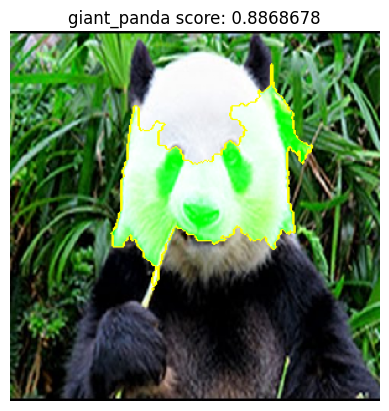

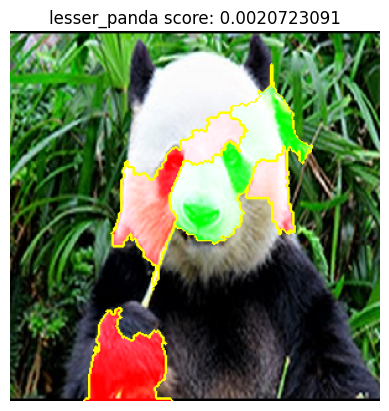

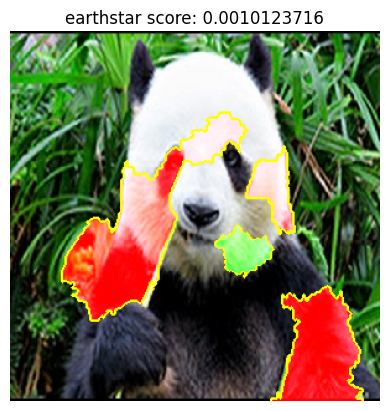

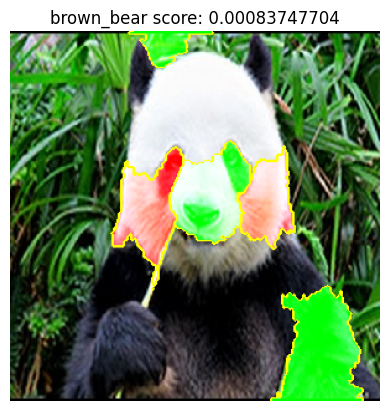

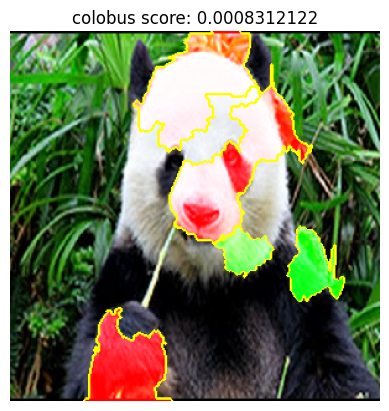

In [87]:
for i in range(len(decode_panda)):
    generate_prediction_sample(exp_panda, exp_panda.top_labels[i],
     class_name = decode_panda[i][1] + " score: " + decode_panda[i][2].astype("str"))

In [67]:
def explanation_heatmap(exp, exp_class, class_name = None):

    dict_heatmap = dict(exp.local_exp[exp_class])
    heatmap = np.vectorize(dict_heatmap.get)(exp.segments)
    plt.imshow(heatmap, cmap = "coolwarm", vmin = -heatmap.max(), vmax = heatmap.max())
    plt.colorbar()
    if class_name is not None:
        plt.title(class_name)
    plt.show()

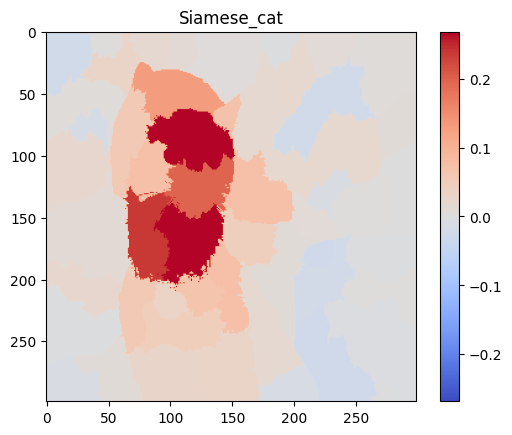

In [88]:
explanation_heatmap(exp_cat, exp_cat.top_labels[0], class_name = decode_cat[0][1])

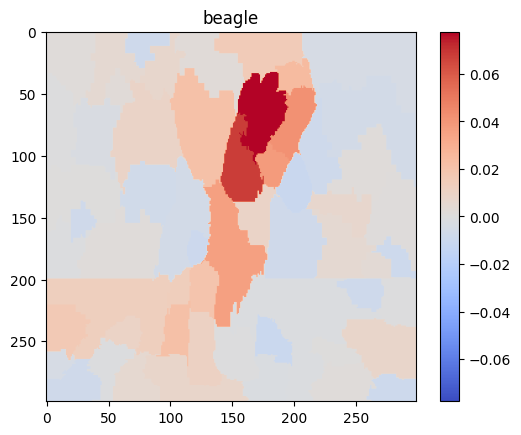

In [89]:
explanation_heatmap(exp_dog, exp_dog.top_labels[0], class_name = decode_dog[0][1]) 

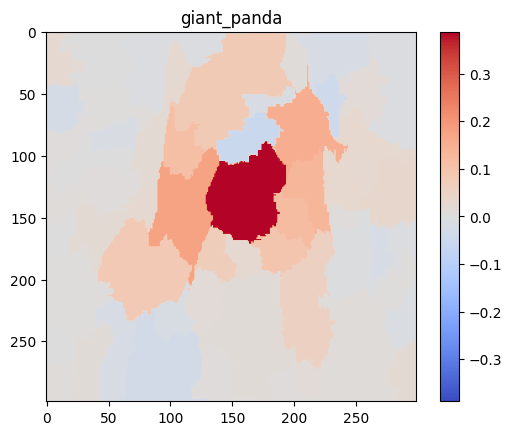

In [90]:
explanation_heatmap(exp_panda, exp_panda.top_labels[0], class_name = decode_panda[0][1])

Let us compare ROIs of Xception to ROIs of MobileNet.   
MobileNet beeing destined to quick and low memory usage, we may expect results to be less precise than for Xception.

In [5]:
from keras.applications.mobilenet import MobileNet
from keras.applications.mobilenet import decode_predictions as dp_mn

In [6]:
def load_and_preprocess_MobileNet(image_path, image_size):

    image = load_img(image_path, target_size = image_size)
    image = img_to_array(image)
    image = np.expand_dims(image, axis = 0)
    image = image / 255.0
    return image

In [7]:
imageSize_mn = (224, 224, 3)
cat_mn = load_and_preprocess_MobileNet("../images/cat.jpg", imageSize_mn)

In [8]:
network_mn = MobileNet(weights = "imagenet")
predictions_mn_cat = network_mn.predict(cat_mn)
decode_mn_cat = dp_mn(predictions_mn_cat, top = 5)[0]

1/1 [==============================] - 3s 3s/step


In [27]:
for c in decode_mn_cat:
    print(c[1])

Siamese_cat
bow_tie
Egyptian_cat
jay
standard_schnauzer


We see that predictions 2, 3, 4 and 5 are not correct.
We can try to understand why using LIME, with the sames parameters that we use for Xception

In [9]:
explainer_mn = lime_image.LimeImageExplainer()
exp_mn_cat = explainer_mn.explain_instance(cat_mn[0], network_mn.predict, 
                top_labels = 5, hide_color = 0, num_samples = 1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 685ms/step


  1%|          | 10/1000 [00:01<01:52,  8.77it/s]

1/1 [==============================] - 1s 759ms/step


  3%|▎         | 26/1000 [00:02<01:16, 12.78it/s]

1/1 [==============================] - 1s 618ms/step


  4%|▎         | 35/1000 [00:03<01:20, 11.93it/s]

1/1 [==============================] - 1s 646ms/step


  5%|▍         | 49/1000 [00:04<01:08, 13.93it/s]

1/1 [==============================] - 1s 786ms/step


  5%|▌         | 53/1000 [00:05<02:07,  7.46it/s]

1/1 [==============================] - 1s 684ms/step


  7%|▋         | 66/1000 [00:06<01:34,  9.86it/s]

1/1 [==============================] - 1s 692ms/step


  7%|▋         | 74/1000 [00:07<01:40,  9.18it/s]

1/1 [==============================] - 1s 652ms/step


  9%|▊         | 86/1000 [00:09<01:24, 10.80it/s]

1/1 [==============================] - 1s 764ms/step


 10%|▉         | 96/1000 [00:10<01:26, 10.42it/s]

1/1 [==============================] - 1s 877ms/step


 11%|█         | 109/1000 [00:12<01:32,  9.60it/s]

1/1 [==============================] - 1s 845ms/step


 12%|█▏        | 117/1000 [00:13<01:48,  8.17it/s]

1/1 [==============================] - 1s 799ms/step


 12%|█▏        | 124/1000 [00:14<01:58,  7.38it/s]

1/1 [==============================] - 1s 561ms/step


 14%|█▎        | 137/1000 [00:15<01:18, 10.97it/s]

1/1 [==============================] - 1s 587ms/step


 15%|█▍        | 147/1000 [00:16<01:14, 11.41it/s]

1/1 [==============================] - 1s 597ms/step


 15%|█▌        | 151/1000 [00:17<01:36,  8.75it/s]

1/1 [==============================] - 1s 638ms/step


 17%|█▋        | 169/1000 [00:18<01:01, 13.52it/s]

1/1 [==============================] - 1s 641ms/step


 17%|█▋        | 173/1000 [00:19<01:36,  8.56it/s]

1/1 [==============================] - 1s 634ms/step


 19%|█▉        | 188/1000 [00:20<01:06, 12.29it/s]

1/1 [==============================] - 1s 643ms/step


 19%|█▉        | 192/1000 [00:21<01:28,  9.08it/s]

1/1 [==============================] - 1s 660ms/step


 21%|██        | 206/1000 [00:22<01:08, 11.58it/s]

1/1 [==============================] - 1s 656ms/step


 22%|██▏       | 218/1000 [00:23<01:01, 12.67it/s]

1/1 [==============================] - 1s 586ms/step


 23%|██▎       | 229/1000 [00:24<00:57, 13.30it/s]

1/1 [==============================] - 1s 776ms/step


 24%|██▍       | 238/1000 [00:25<01:07, 11.28it/s]

1/1 [==============================] - 1s 568ms/step


 24%|██▍       | 242/1000 [00:26<01:32,  8.18it/s]

1/1 [==============================] - 1s 622ms/step


 26%|██▌       | 259/1000 [00:27<00:56, 13.07it/s]

1/1 [==============================] - 1s 564ms/step


 26%|██▋       | 263/1000 [00:28<01:16,  9.59it/s]

1/1 [==============================] - 1s 568ms/step


 28%|██▊       | 278/1000 [00:29<00:53, 13.40it/s]

1/1 [==============================] - 1s 566ms/step


 28%|██▊       | 282/1000 [00:30<01:09, 10.36it/s]

1/1 [==============================] - 1s 588ms/step


 30%|██▉       | 298/1000 [00:31<00:50, 13.84it/s]

1/1 [==============================] - 1s 690ms/step


 31%|███       | 309/1000 [00:32<00:55, 12.41it/s]

1/1 [==============================] - 1s 795ms/step


 31%|███       | 312/1000 [00:33<01:36,  7.09it/s]

1/1 [==============================] - 1s 606ms/step


 33%|███▎      | 328/1000 [00:34<00:55, 12.00it/s]

1/1 [==============================] - 1s 628ms/step


 33%|███▎      | 332/1000 [00:35<01:15,  8.84it/s]

1/1 [==============================] - 1s 644ms/step


 35%|███▍      | 347/1000 [00:36<00:53, 12.22it/s]

1/1 [==============================] - 1s 675ms/step


 36%|███▌      | 358/1000 [00:37<00:50, 12.65it/s]

1/1 [==============================] - 1s 578ms/step


 36%|███▌      | 362/1000 [00:38<01:11,  8.95it/s]

1/1 [==============================] - 1s 585ms/step


 38%|███▊      | 375/1000 [00:39<00:54, 11.42it/s]

1/1 [==============================] - 1s 792ms/step


 39%|███▉      | 388/1000 [00:40<00:53, 11.53it/s]

1/1 [==============================] - 1s 680ms/step


 40%|███▉      | 396/1000 [00:42<01:01,  9.87it/s]

1/1 [==============================] - 1s 827ms/step


 41%|████      | 408/1000 [00:43<00:55, 10.60it/s]

1/1 [==============================] - 1s 839ms/step


 42%|████▏     | 417/1000 [00:44<00:59,  9.77it/s]

1/1 [==============================] - 1s 562ms/step


 43%|████▎     | 428/1000 [00:45<00:49, 11.47it/s]

1/1 [==============================] - 1s 572ms/step


 44%|████▍     | 439/1000 [00:46<00:45, 12.24it/s]

1/1 [==============================] - 1s 728ms/step


 45%|████▍     | 449/1000 [00:47<00:49, 11.14it/s]

1/1 [==============================] - 1s 801ms/step


 46%|████▌     | 459/1000 [00:49<00:54,  9.89it/s]

1/1 [==============================] - 1s 609ms/step


 46%|████▋     | 463/1000 [00:50<01:14,  7.20it/s]

1/1 [==============================] - 1s 777ms/step


 48%|████▊     | 477/1000 [00:51<00:57,  9.08it/s]

1/1 [==============================] - 1s 697ms/step


 49%|████▉     | 488/1000 [00:52<00:49, 10.44it/s]

1/1 [==============================] - 1s 769ms/step


 50%|████▉     | 497/1000 [00:53<00:50,  9.96it/s]

1/1 [==============================] - 1s 646ms/step


 51%|█████     | 509/1000 [00:55<00:42, 11.61it/s]

1/1 [==============================] - 1s 570ms/step


 51%|█████▏    | 513/1000 [00:55<00:53,  9.07it/s]

1/1 [==============================] - 1s 625ms/step


 53%|█████▎    | 526/1000 [00:56<00:42, 11.24it/s]

1/1 [==============================] - 1s 589ms/step


 54%|█████▍    | 538/1000 [00:57<00:34, 13.42it/s]

1/1 [==============================] - 1s 592ms/step


 55%|█████▍    | 548/1000 [00:58<00:37, 12.20it/s]

1/1 [==============================] - 1s 583ms/step


 55%|█████▌    | 552/1000 [00:59<00:52,  8.54it/s]

1/1 [==============================] - 1s 800ms/step


 56%|█████▋    | 564/1000 [01:01<00:46,  9.48it/s]

1/1 [==============================] - 1s 722ms/step


 58%|█████▊    | 577/1000 [01:02<00:39, 10.81it/s]

1/1 [==============================] - 1s 761ms/step


 59%|█████▉    | 588/1000 [01:03<00:38, 10.80it/s]

1/1 [==============================] - 1s 890ms/step


 59%|█████▉    | 592/1000 [01:04<00:59,  6.81it/s]

1/1 [==============================] - 1s 568ms/step


 61%|██████    | 606/1000 [01:05<00:38, 10.11it/s]

1/1 [==============================] - 1s 631ms/step


 62%|██████▏   | 616/1000 [01:07<00:36, 10.43it/s]

1/1 [==============================] - 1s 887ms/step


 62%|██████▏   | 624/1000 [01:08<00:46,  8.10it/s]

1/1 [==============================] - 1s 602ms/step


 64%|██████▎   | 637/1000 [01:09<00:33, 10.78it/s]

1/1 [==============================] - 1s 677ms/step


 65%|██████▍   | 646/1000 [01:10<00:35, 10.10it/s]

1/1 [==============================] - 1s 716ms/step


 66%|██████▌   | 657/1000 [01:11<00:33, 10.38it/s]

1/1 [==============================] - 1s 596ms/step


 67%|██████▋   | 669/1000 [01:13<00:26, 12.33it/s]

1/1 [==============================] - 1s 614ms/step


 67%|██████▋   | 673/1000 [01:13<00:35,  9.12it/s]

1/1 [==============================] - 1s 785ms/step


 69%|██████▉   | 688/1000 [01:15<00:26, 11.71it/s]

1/1 [==============================] - 1s 764ms/step


 70%|██████▉   | 697/1000 [01:16<00:29, 10.10it/s]

1/1 [==============================] - 1s 697ms/step


 71%|███████   | 707/1000 [01:17<00:29,  9.92it/s]

1/1 [==============================] - 1s 717ms/step


 72%|███████▏  | 716/1000 [01:18<00:30,  9.37it/s]

1/1 [==============================] - 1s 581ms/step


 73%|███████▎  | 728/1000 [01:19<00:22, 12.15it/s]

1/1 [==============================] - 1s 659ms/step


 73%|███████▎  | 732/1000 [01:20<00:31,  8.57it/s]

1/1 [==============================] - 1s 827ms/step


 74%|███████▍  | 745/1000 [01:21<00:25, 10.00it/s]

1/1 [==============================] - 1s 716ms/step


 76%|███████▌  | 757/1000 [01:23<00:22, 10.74it/s]

1/1 [==============================] - 1s 772ms/step


 77%|███████▋  | 767/1000 [01:24<00:22, 10.21it/s]

1/1 [==============================] - 1s 758ms/step


 78%|███████▊  | 777/1000 [01:25<00:21, 10.16it/s]

1/1 [==============================] - 1s 609ms/step


 78%|███████▊  | 781/1000 [01:26<00:28,  7.60it/s]

1/1 [==============================] - 1s 600ms/step


 80%|███████▉  | 797/1000 [01:27<00:17, 11.92it/s]

1/1 [==============================] - 1s 836ms/step


 81%|████████  | 809/1000 [01:29<00:17, 11.13it/s]

1/1 [==============================] - 1s 793ms/step


 82%|████████▏ | 817/1000 [01:30<00:19,  9.20it/s]

1/1 [==============================] - 1s 646ms/step


 83%|████████▎ | 829/1000 [01:31<00:15, 11.32it/s]

1/1 [==============================] - 1s 887ms/step


 83%|████████▎ | 833/1000 [01:32<00:24,  6.93it/s]

1/1 [==============================] - 1s 654ms/step


 85%|████████▍ | 848/1000 [01:33<00:14, 10.59it/s]

1/1 [==============================] - 1s 535ms/step


 85%|████████▌ | 852/1000 [01:34<00:17,  8.61it/s]

1/1 [==============================] - 1s 812ms/step


 87%|████████▋ | 867/1000 [01:36<00:12, 10.80it/s]

1/1 [==============================] - 1s 615ms/step


 88%|████████▊ | 877/1000 [01:37<00:11, 10.93it/s]

1/1 [==============================] - 1s 624ms/step


 89%|████████▉ | 889/1000 [01:38<00:09, 11.89it/s]

1/1 [==============================] - 1s 886ms/step


 89%|████████▉ | 894/1000 [01:39<00:13,  7.94it/s]

1/1 [==============================] - 1s 844ms/step


 91%|█████████ | 907/1000 [01:40<00:09,  9.90it/s]

1/1 [==============================] - 1s 613ms/step


 92%|█████████▏| 918/1000 [01:41<00:07, 11.62it/s]

1/1 [==============================] - 1s 939ms/step


 92%|█████████▏| 922/1000 [01:43<00:10,  7.12it/s]

1/1 [==============================] - 1s 615ms/step


 94%|█████████▎| 937/1000 [01:44<00:05, 10.86it/s]

1/1 [==============================] - 1s 563ms/step


 94%|█████████▍| 941/1000 [01:44<00:07,  8.37it/s]

1/1 [==============================] - 1s 635ms/step


 96%|█████████▌| 957/1000 [01:46<00:03, 12.12it/s]

1/1 [==============================] - 1s 595ms/step


 97%|█████████▋| 969/1000 [01:46<00:02, 13.70it/s]

1/1 [==============================] - 1s 600ms/step


 97%|█████████▋| 974/1000 [01:47<00:02, 10.14it/s]

1/1 [==============================] - 1s 626ms/step


 99%|█████████▉| 988/1000 [01:48<00:00, 12.72it/s]

1/1 [==============================] - 1s 860ms/step


100%|█████████▉| 996/1000 [01:50<00:00,  9.74it/s]

1/1 [==============================] - 1s 720ms/step


100%|██████████| 1000/1000 [01:51<00:00,  8.98it/s]


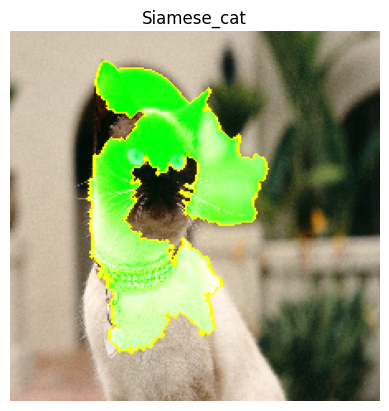

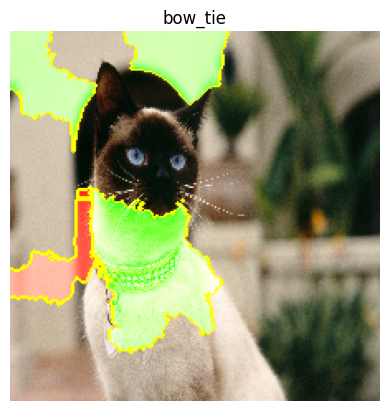

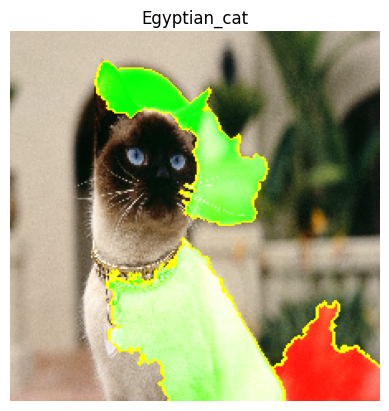

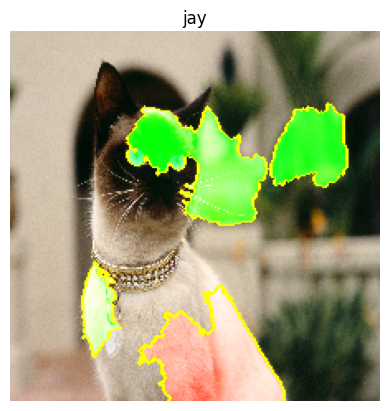

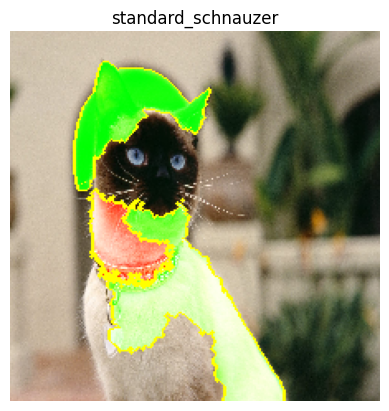

In [91]:
for i in range(len(decode_mn_cat)):
    generate_prediction_sample(exp_mn_cat, exp_mn_cat.top_labels[i], class_name = decode_mn_cat[i][1])

We can see that the ROI used by MobileNet is worse than the one used by Xception as the cat's face is completely mixed with the slice of bread.
Let's try with the picture of the dog that does not contain any foreign object.

In [12]:
dog_mn = load_and_preprocess_MobileNet("../images/dog.jpg", imageSize_mn)

In [13]:
predictions_mn_dog = network_mn.predict(dog_mn)
decode_mn_dog = dp_mn(predictions_mn_dog, top = 5)[0]

1/1 [==============================] - 0s 200ms/step


In [32]:
for c in decode_mn_dog:
    print(c[1])

beagle
Walker_hound
English_foxhound
basset
Lakeland_terrier


In [14]:
exp_mn_dog = explainer_mn.explain_instance(dog_mn[0], network_mn.predict, 
                        hide_color = 0, top_labels = 5, num_samples = 1000)

  1%|          | 7/1000 [00:00<00:16, 58.67it/s]

1/1 [==============================] - 1s 932ms/step


  1%|▏         | 13/1000 [00:01<02:13,  7.38it/s]

1/1 [==============================] - 1s 633ms/step


  3%|▎         | 27/1000 [00:02<01:28, 10.99it/s]

1/1 [==============================] - 1s 558ms/step


  3%|▎         | 31/1000 [00:03<01:55,  8.36it/s]

1/1 [==============================] - 1s 565ms/step


  5%|▍         | 48/1000 [00:04<01:07, 14.02it/s]

1/1 [==============================] - 1s 689ms/step


  6%|▌         | 59/1000 [00:05<01:11, 13.19it/s]

1/1 [==============================] - 1s 855ms/step


  7%|▋         | 66/1000 [00:06<01:39,  9.41it/s]

1/1 [==============================] - 1s 727ms/step


  8%|▊         | 79/1000 [00:08<01:22, 11.23it/s]

1/1 [==============================] - 1s 729ms/step


  8%|▊         | 83/1000 [00:09<02:03,  7.43it/s]

1/1 [==============================] - 1s 795ms/step


 10%|▉         | 97/1000 [00:10<01:28, 10.16it/s]

1/1 [==============================] - 1s 612ms/step


 11%|█         | 109/1000 [00:11<01:13, 12.19it/s]

1/1 [==============================] - 1s 600ms/step


 11%|█▏        | 113/1000 [00:12<01:35,  9.31it/s]

1/1 [==============================] - 1s 669ms/step


 13%|█▎        | 126/1000 [00:13<01:17, 11.25it/s]

1/1 [==============================] - 1s 657ms/step


 14%|█▎        | 137/1000 [00:14<01:20, 10.71it/s]

1/1 [==============================] - 1s 696ms/step


 15%|█▍        | 147/1000 [00:15<01:19, 10.77it/s]

1/1 [==============================] - 1s 688ms/step


 16%|█▌        | 159/1000 [00:17<01:13, 11.45it/s]

1/1 [==============================] - 1s 815ms/step


 16%|█▋        | 164/1000 [00:18<01:50,  7.56it/s]

1/1 [==============================] - 1s 630ms/step


 18%|█▊        | 179/1000 [00:19<01:12, 11.31it/s]

1/1 [==============================] - 1s 857ms/step


 19%|█▉        | 189/1000 [00:20<01:18, 10.38it/s]

1/1 [==============================] - 1s 686ms/step


 20%|█▉        | 197/1000 [00:21<01:27,  9.13it/s]

1/1 [==============================] - 1s 642ms/step


 21%|██        | 208/1000 [00:22<01:11, 11.03it/s]

1/1 [==============================] - 1s 767ms/step


 21%|██        | 212/1000 [00:23<01:49,  7.19it/s]

1/1 [==============================] - 1s 577ms/step


 23%|██▎       | 226/1000 [00:24<01:12, 10.69it/s]

1/1 [==============================] - 1s 552ms/step


 23%|██▎       | 230/1000 [00:25<01:29,  8.56it/s]

1/1 [==============================] - 1s 597ms/step


 24%|██▍       | 245/1000 [00:26<01:03, 11.88it/s]

1/1 [==============================] - 1s 682ms/step


 26%|██▌       | 259/1000 [00:27<00:55, 13.42it/s]

1/1 [==============================] - 1s 538ms/step


 26%|██▋       | 263/1000 [00:28<01:13, 10.06it/s]

1/1 [==============================] - 1s 549ms/step


 27%|██▋       | 270/1000 [00:29<01:17,  9.41it/s]

1/1 [==============================] - 1s 524ms/step


 29%|██▉       | 289/1000 [00:30<00:47, 14.99it/s]

1/1 [==============================] - 1s 566ms/step


 29%|██▉       | 293/1000 [00:31<01:03, 11.20it/s]

1/1 [==============================] - 1s 651ms/step


 31%|███       | 308/1000 [00:32<00:51, 13.44it/s]

1/1 [==============================] - 1s 591ms/step


 32%|███▏      | 318/1000 [00:33<00:52, 12.99it/s]

1/1 [==============================] - 1s 765ms/step


 33%|███▎      | 326/1000 [00:34<01:04, 10.39it/s]

1/1 [==============================] - 1s 587ms/step


 34%|███▎      | 336/1000 [00:35<00:59, 11.16it/s]

1/1 [==============================] - 1s 615ms/step


 35%|███▍      | 348/1000 [00:36<00:48, 13.35it/s]

1/1 [==============================] - 1s 603ms/step


 35%|███▌      | 352/1000 [00:37<01:08,  9.47it/s]

1/1 [==============================] - 1s 564ms/step


 37%|███▋      | 367/1000 [00:38<00:46, 13.54it/s]

1/1 [==============================] - 1s 550ms/step


 37%|███▋      | 371/1000 [00:38<01:01, 10.19it/s]

1/1 [==============================] - 1s 581ms/step


 39%|███▉      | 389/1000 [00:39<00:39, 15.29it/s]

1/1 [==============================] - 1s 607ms/step


 40%|███▉      | 398/1000 [00:40<00:48, 12.44it/s]

1/1 [==============================] - 1s 734ms/step


 41%|████      | 408/1000 [00:42<00:54, 10.86it/s]

1/1 [==============================] - 1s 507ms/step


 41%|████      | 412/1000 [00:42<01:07,  8.66it/s]

1/1 [==============================] - 1s 614ms/step


 43%|████▎     | 428/1000 [00:43<00:44, 12.92it/s]

1/1 [==============================] - 1s 548ms/step


 43%|████▎     | 432/1000 [00:44<00:57,  9.90it/s]

1/1 [==============================] - 1s 579ms/step


 44%|████▍     | 440/1000 [00:45<00:58,  9.62it/s]

1/1 [==============================] - 1s 531ms/step


 46%|████▌     | 458/1000 [00:46<00:37, 14.46it/s]

1/1 [==============================] - 1s 542ms/step


 47%|████▋     | 469/1000 [00:47<00:35, 14.75it/s]

1/1 [==============================] - 1s 661ms/step


 48%|████▊     | 479/1000 [00:48<00:40, 12.75it/s]

1/1 [==============================] - 1s 596ms/step


 48%|████▊     | 483/1000 [00:49<01:00,  8.58it/s]

1/1 [==============================] - 1s 657ms/step


 50%|████▉     | 496/1000 [00:50<00:45, 11.08it/s]

1/1 [==============================] - 1s 560ms/step


 51%|█████     | 508/1000 [00:51<00:37, 13.18it/s]

1/1 [==============================] - 1s 544ms/step


 51%|█████     | 512/1000 [00:52<00:51,  9.48it/s]

1/1 [==============================] - 1s 531ms/step


 53%|█████▎    | 528/1000 [00:53<00:33, 14.07it/s]

1/1 [==============================] - 1s 562ms/step


 53%|█████▎    | 532/1000 [00:53<00:45, 10.23it/s]

1/1 [==============================] - 1s 522ms/step


 55%|█████▍    | 545/1000 [00:54<00:35, 12.76it/s]

1/1 [==============================] - 1s 772ms/step


 56%|█████▌    | 556/1000 [00:56<00:42, 10.50it/s]

1/1 [==============================] - 1s 1s/step


 57%|█████▋    | 567/1000 [00:57<00:48,  8.96it/s]

1/1 [==============================] - 1s 762ms/step


 58%|█████▊    | 579/1000 [00:59<00:42,  9.96it/s]

1/1 [==============================] - 1s 517ms/step


 58%|█████▊    | 584/1000 [01:00<00:49,  8.36it/s]

1/1 [==============================] - 1s 683ms/step


 60%|█████▉    | 597/1000 [01:01<00:37, 10.81it/s]

1/1 [==============================] - 1s 800ms/step


 61%|██████    | 606/1000 [01:02<00:39,  9.99it/s]

1/1 [==============================] - 1s 571ms/step


 61%|██████    | 610/1000 [01:03<00:48,  7.98it/s]

1/1 [==============================] - 1s 537ms/step


 63%|██████▎   | 629/1000 [01:04<00:25, 14.32it/s]

1/1 [==============================] - 1s 537ms/step


 63%|██████▎   | 634/1000 [01:05<00:33, 10.96it/s]

1/1 [==============================] - 1s 549ms/step


 65%|██████▍   | 648/1000 [01:05<00:25, 13.69it/s]

1/1 [==============================] - 1s 545ms/step


 66%|██████▌   | 657/1000 [01:06<00:26, 12.80it/s]

1/1 [==============================] - 1s 563ms/step


 67%|██████▋   | 668/1000 [01:07<00:25, 13.12it/s]

1/1 [==============================] - 1s 569ms/step


 67%|██████▋   | 672/1000 [01:08<00:34,  9.49it/s]

1/1 [==============================] - 1s 822ms/step


 69%|██████▊   | 687/1000 [01:10<00:28, 11.13it/s]

1/1 [==============================] - 1s 663ms/step


 69%|██████▉   | 694/1000 [01:11<00:34,  8.94it/s]

1/1 [==============================] - 1s 698ms/step


 70%|███████   | 700/1000 [01:12<00:41,  7.24it/s]

1/1 [==============================] - 1s 857ms/step


 72%|███████▏  | 717/1000 [01:13<00:26, 10.77it/s]

1/1 [==============================] - 1s 566ms/step


 73%|███████▎  | 729/1000 [01:14<00:21, 12.52it/s]

1/1 [==============================] - 1s 595ms/step


 73%|███████▎  | 733/1000 [01:15<00:28,  9.32it/s]

1/1 [==============================] - 1s 843ms/step


 75%|███████▍  | 746/1000 [01:16<00:24, 10.44it/s]

1/1 [==============================] - 1s 655ms/step


 76%|███████▌  | 755/1000 [01:17<00:24,  9.80it/s]

1/1 [==============================] - 1s 697ms/step


 77%|███████▋  | 769/1000 [01:19<00:19, 11.83it/s]

1/1 [==============================] - 1s 765ms/step


 77%|███████▋  | 773/1000 [01:20<00:28,  8.00it/s]

1/1 [==============================] - 1s 834ms/step


 79%|███████▉  | 788/1000 [01:21<00:21, 10.08it/s]

1/1 [==============================] - 1s 886ms/step


 80%|███████▉  | 797/1000 [01:23<00:23,  8.67it/s]

1/1 [==============================] - 1s 815ms/step


 81%|████████  | 809/1000 [01:24<00:19,  9.69it/s]

1/1 [==============================] - 1s 816ms/step


 81%|████████▏ | 814/1000 [01:25<00:25,  7.28it/s]

1/1 [==============================] - 1s 789ms/step


 83%|████████▎ | 827/1000 [01:26<00:17,  9.64it/s]

1/1 [==============================] - 1s 602ms/step


 84%|████████▎ | 836/1000 [01:27<00:16, 10.24it/s]

1/1 [==============================] - 1s 528ms/step


 85%|████████▍ | 849/1000 [01:28<00:11, 13.30it/s]

1/1 [==============================] - 1s 612ms/step


 85%|████████▌ | 854/1000 [01:29<00:15,  9.60it/s]

1/1 [==============================] - 1s 690ms/step


 87%|████████▋ | 867/1000 [01:30<00:12, 10.98it/s]

1/1 [==============================] - 1s 636ms/step


 87%|████████▋ | 871/1000 [01:32<00:16,  7.77it/s]

1/1 [==============================] - 1s 556ms/step


 89%|████████▉ | 888/1000 [01:33<00:09, 11.91it/s]

1/1 [==============================] - 1s 798ms/step


 90%|████████▉ | 898/1000 [01:34<00:09, 11.01it/s]

1/1 [==============================] - 1s 629ms/step


 91%|█████████ | 909/1000 [01:35<00:07, 11.84it/s]

1/1 [==============================] - 1s 556ms/step


 91%|█████████▏| 913/1000 [01:36<00:09,  9.19it/s]

1/1 [==============================] - 1s 887ms/step


 93%|█████████▎| 926/1000 [01:37<00:07, 10.45it/s]

1/1 [==============================] - 1s 743ms/step


 94%|█████████▍| 939/1000 [01:39<00:05, 11.09it/s]

1/1 [==============================] - 1s 873ms/step


 95%|█████████▍| 947/1000 [01:40<00:06,  7.75it/s]

1/1 [==============================] - 1s 781ms/step


 96%|█████████▌| 956/1000 [01:41<00:05,  8.22it/s]

1/1 [==============================] - 1s 915ms/step


 97%|█████████▋| 967/1000 [01:43<00:03,  8.69it/s]

1/1 [==============================] - 1s 964ms/step


 98%|█████████▊| 976/1000 [01:44<00:03,  7.82it/s]

1/1 [==============================] - 1s 760ms/step


 99%|█████████▊| 986/1000 [01:46<00:01,  8.56it/s]

1/1 [==============================] - 1s 725ms/step


100%|█████████▉| 997/1000 [01:47<00:00,  9.75it/s]

1/1 [==============================] - 1s 747ms/step


100%|██████████| 1000/1000 [01:48<00:00,  9.22it/s]


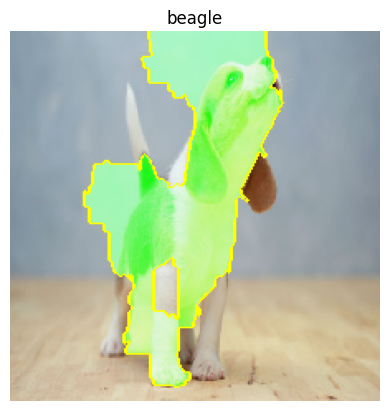

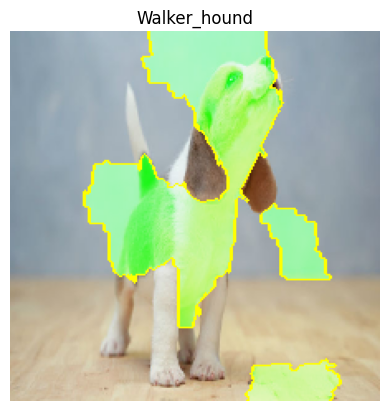

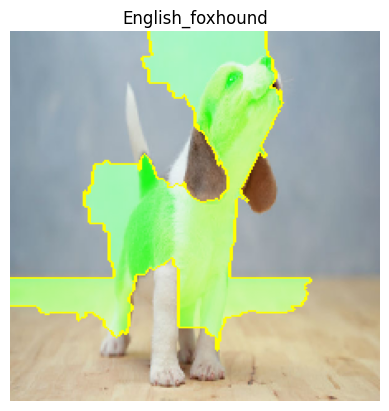

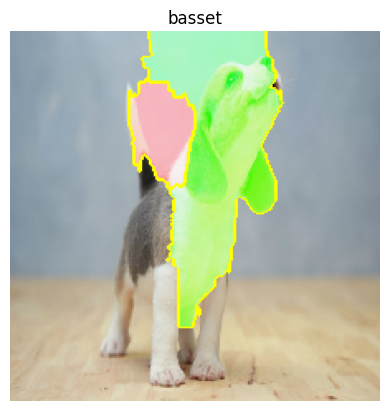

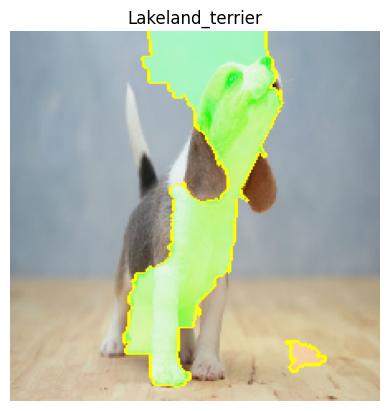

In [34]:
for i in range(len(decode_mn_dog)):
    generate_prediction_sample(exp_mn_dog, exp_mn_dog.top_labels[i], class_name = decode_mn_dog[i][1])

The ROI for the Beagle class is more complete with MobileNet than with Xception as it takes into account the whole body of the dog except the front legs, that seem to be the differenciation area between these classes.    
Finally, let's test with the panda example.

In [33]:
panda_mn = load_and_preprocess_MobileNet("../images/panda.jpg", imageSize_mn)

predictions_mn_panda = network_mn.predict(panda_mn)
decode_mn_panda = dp_mn(predictions_mn_panda, top = 5)[0]

1/1 [==============================] - 0s 108ms/step


In [92]:
exp_mn_panda = explainer_mn.explain_instance(panda_mn[0], network_mn.predict,                                            
                        hide_color = 0, top_labels = 5, num_samples = 1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 517ms/step


  1%|          | 10/1000 [00:00<01:04, 15.26it/s]

1/1 [==============================] - 0s 355ms/step


  2%|▏         | 20/1000 [00:01<00:54, 17.97it/s]

1/1 [==============================] - 0s 354ms/step


  3%|▎         | 30/1000 [00:01<00:51, 18.81it/s]

1/1 [==============================] - 0s 327ms/step


  4%|▍         | 40/1000 [00:02<00:48, 19.83it/s]

1/1 [==============================] - 0s 334ms/step


  5%|▌         | 50/1000 [00:02<00:46, 20.45it/s]

1/1 [==============================] - 0s 338ms/step


  6%|▌         | 60/1000 [00:03<00:47, 19.78it/s]

1/1 [==============================] - 0s 323ms/step


  7%|▋         | 70/1000 [00:03<00:45, 20.59it/s]

1/1 [==============================] - 0s 325ms/step


  8%|▊         | 80/1000 [00:04<00:44, 20.81it/s]

1/1 [==============================] - 0s 308ms/step


  9%|▉         | 90/1000 [00:04<00:41, 21.72it/s]

1/1 [==============================] - 0s 337ms/step


 10%|█         | 100/1000 [00:04<00:41, 21.64it/s]

1/1 [==============================] - 0s 312ms/step


 11%|█         | 110/1000 [00:05<00:40, 22.02it/s]

1/1 [==============================] - 0s 332ms/step


 12%|█▏        | 120/1000 [00:05<00:39, 22.12it/s]

1/1 [==============================] - 0s 333ms/step


 13%|█▎        | 130/1000 [00:06<00:40, 21.70it/s]

1/1 [==============================] - 0s 336ms/step


 14%|█▍        | 140/1000 [00:06<00:39, 21.50it/s]

1/1 [==============================] - 0s 350ms/step


 15%|█▌        | 150/1000 [00:07<00:40, 21.24it/s]

1/1 [==============================] - 0s 362ms/step


 16%|█▌        | 160/1000 [00:07<00:42, 19.98it/s]

1/1 [==============================] - 0s 329ms/step


 17%|█▋        | 170/1000 [00:08<00:41, 20.20it/s]

1/1 [==============================] - 0s 330ms/step


 18%|█▊        | 180/1000 [00:08<00:39, 20.54it/s]

1/1 [==============================] - 0s 347ms/step


 19%|█▉        | 190/1000 [00:09<00:39, 20.52it/s]

1/1 [==============================] - 0s 310ms/step


 20%|██        | 200/1000 [00:09<00:38, 20.73it/s]

1/1 [==============================] - 0s 375ms/step


 21%|██        | 210/1000 [00:10<00:39, 19.94it/s]

1/1 [==============================] - 0s 330ms/step


 22%|██▏       | 220/1000 [00:10<00:39, 19.80it/s]

1/1 [==============================] - 0s 346ms/step


 23%|██▎       | 230/1000 [00:11<00:38, 20.05it/s]

1/1 [==============================] - 0s 340ms/step


 24%|██▍       | 240/1000 [00:11<00:37, 20.24it/s]

1/1 [==============================] - 0s 324ms/step


 25%|██▌       | 250/1000 [00:12<00:36, 20.68it/s]

1/1 [==============================] - 0s 312ms/step


 26%|██▌       | 260/1000 [00:12<00:35, 20.66it/s]

1/1 [==============================] - 0s 337ms/step


 27%|██▋       | 270/1000 [00:13<00:36, 19.89it/s]

1/1 [==============================] - 0s 316ms/step


 28%|██▊       | 280/1000 [00:13<00:35, 20.49it/s]

1/1 [==============================] - 0s 341ms/step


 29%|██▉       | 290/1000 [00:14<00:34, 20.72it/s]

1/1 [==============================] - 0s 322ms/step


 30%|███       | 300/1000 [00:14<00:33, 20.99it/s]

1/1 [==============================] - 0s 333ms/step


 31%|███       | 310/1000 [00:15<00:32, 21.13it/s]

1/1 [==============================] - 0s 347ms/step


 32%|███▏      | 320/1000 [00:15<00:32, 21.01it/s]

1/1 [==============================] - 0s 334ms/step


 33%|███▎      | 330/1000 [00:16<00:31, 21.17it/s]

1/1 [==============================] - 0s 319ms/step


 34%|███▍      | 340/1000 [00:16<00:30, 21.37it/s]

1/1 [==============================] - 0s 320ms/step


 35%|███▌      | 350/1000 [00:16<00:30, 21.41it/s]

1/1 [==============================] - 0s 323ms/step


 36%|███▌      | 360/1000 [00:17<00:29, 21.53it/s]

1/1 [==============================] - 0s 333ms/step


 37%|███▋      | 370/1000 [00:17<00:29, 21.61it/s]

1/1 [==============================] - 0s 351ms/step


 38%|███▊      | 380/1000 [00:18<00:30, 20.13it/s]

1/1 [==============================] - 0s 364ms/step


 39%|███▉      | 390/1000 [00:18<00:30, 19.84it/s]

1/1 [==============================] - 0s 377ms/step


 40%|████      | 400/1000 [00:19<00:31, 19.16it/s]

1/1 [==============================] - 0s 355ms/step


 41%|████      | 410/1000 [00:20<00:31, 19.02it/s]

1/1 [==============================] - 0s 359ms/step


 42%|████▏     | 420/1000 [00:20<00:30, 18.77it/s]

1/1 [==============================] - 0s 335ms/step


 43%|████▎     | 430/1000 [00:21<00:29, 19.37it/s]

1/1 [==============================] - 0s 315ms/step


 44%|████▍     | 440/1000 [00:21<00:28, 19.97it/s]

1/1 [==============================] - 0s 344ms/step


 45%|████▌     | 450/1000 [00:22<00:27, 20.33it/s]

1/1 [==============================] - 0s 338ms/step


 46%|████▌     | 460/1000 [00:22<00:26, 20.45it/s]

1/1 [==============================] - 0s 335ms/step


 47%|████▋     | 470/1000 [00:22<00:25, 20.48it/s]

1/1 [==============================] - 0s 356ms/step


 48%|████▊     | 480/1000 [00:23<00:26, 19.97it/s]

1/1 [==============================] - 0s 334ms/step


 49%|████▉     | 490/1000 [00:23<00:24, 20.43it/s]

1/1 [==============================] - 0s 321ms/step


 50%|█████     | 500/1000 [00:24<00:24, 20.72it/s]

1/1 [==============================] - 0s 322ms/step


 51%|█████     | 510/1000 [00:24<00:23, 21.11it/s]

1/1 [==============================] - 0s 342ms/step


 52%|█████▏    | 520/1000 [00:25<00:22, 20.93it/s]

1/1 [==============================] - 0s 378ms/step


 53%|█████▎    | 530/1000 [00:25<00:23, 20.19it/s]

1/1 [==============================] - 0s 343ms/step


 54%|█████▍    | 540/1000 [00:26<00:22, 20.46it/s]

1/1 [==============================] - 0s 343ms/step


 55%|█████▌    | 550/1000 [00:26<00:21, 20.74it/s]

1/1 [==============================] - 0s 332ms/step


 56%|█████▌    | 560/1000 [00:27<00:21, 20.77it/s]

1/1 [==============================] - 0s 337ms/step


 57%|█████▋    | 570/1000 [00:27<00:20, 20.97it/s]

1/1 [==============================] - 0s 370ms/step


 58%|█████▊    | 580/1000 [00:28<00:20, 20.38it/s]

1/1 [==============================] - 0s 336ms/step


 59%|█████▉    | 590/1000 [00:28<00:19, 20.73it/s]

1/1 [==============================] - 0s 334ms/step


 60%|██████    | 600/1000 [00:29<00:19, 21.04it/s]

1/1 [==============================] - 0s 320ms/step


 61%|██████    | 610/1000 [00:29<00:18, 21.35it/s]

1/1 [==============================] - 0s 330ms/step


 62%|██████▏   | 620/1000 [00:30<00:18, 20.44it/s]

1/1 [==============================] - 0s 348ms/step


 63%|██████▎   | 630/1000 [00:30<00:18, 20.54it/s]

1/1 [==============================] - 0s 375ms/step


 64%|██████▍   | 640/1000 [00:31<00:18, 19.83it/s]

1/1 [==============================] - 0s 342ms/step


 65%|██████▌   | 650/1000 [00:31<00:17, 20.10it/s]

1/1 [==============================] - 0s 318ms/step


 66%|██████▌   | 660/1000 [00:32<00:16, 20.65it/s]

1/1 [==============================] - 0s 385ms/step


 67%|██████▋   | 670/1000 [00:32<00:16, 20.03it/s]

1/1 [==============================] - 0s 325ms/step


 68%|██████▊   | 680/1000 [00:33<00:16, 19.30it/s]

1/1 [==============================] - 0s 329ms/step


 69%|██████▉   | 690/1000 [00:33<00:15, 20.03it/s]

1/1 [==============================] - 0s 384ms/step


 70%|███████   | 700/1000 [00:34<00:15, 19.46it/s]

1/1 [==============================] - 0s 324ms/step


 71%|███████   | 710/1000 [00:34<00:14, 20.01it/s]

1/1 [==============================] - 0s 334ms/step


 72%|███████▏  | 720/1000 [00:35<00:13, 20.24it/s]

1/1 [==============================] - 0s 330ms/step


 73%|███████▎  | 730/1000 [00:35<00:13, 20.60it/s]

1/1 [==============================] - 0s 338ms/step


 74%|███████▍  | 740/1000 [00:36<00:12, 20.83it/s]

1/1 [==============================] - 0s 314ms/step


 75%|███████▌  | 750/1000 [00:36<00:12, 20.56it/s]

1/1 [==============================] - 0s 337ms/step


 76%|███████▌  | 760/1000 [00:37<00:11, 20.80it/s]

1/1 [==============================] - 0s 324ms/step


 77%|███████▋  | 770/1000 [00:37<00:10, 20.97it/s]

1/1 [==============================] - 0s 342ms/step


 78%|███████▊  | 780/1000 [00:38<00:10, 20.27it/s]

1/1 [==============================] - 0s 323ms/step


 79%|███████▉  | 790/1000 [00:38<00:10, 20.22it/s]

1/1 [==============================] - 0s 356ms/step


 80%|████████  | 800/1000 [00:39<00:10, 19.83it/s]

1/1 [==============================] - 0s 394ms/step


 81%|████████  | 810/1000 [00:39<00:10, 18.65it/s]

1/1 [==============================] - 0s 398ms/step


 82%|████████▏ | 820/1000 [00:40<00:09, 18.32it/s]

1/1 [==============================] - 0s 440ms/step


 83%|████████▎ | 830/1000 [00:40<00:09, 17.56it/s]

1/1 [==============================] - 0s 373ms/step


 84%|████████▍ | 840/1000 [00:41<00:08, 17.80it/s]

1/1 [==============================] - 0s 389ms/step


 85%|████████▌ | 850/1000 [00:42<00:08, 17.68it/s]

1/1 [==============================] - 0s 358ms/step


 86%|████████▋ | 865/1000 [00:42<00:06, 20.11it/s]

1/1 [==============================] - 0s 390ms/step


 87%|████████▋ | 870/1000 [00:43<00:08, 15.90it/s]

1/1 [==============================] - 0s 381ms/step


 88%|████████▊ | 880/1000 [00:43<00:07, 16.59it/s]

1/1 [==============================] - 0s 453ms/step


 89%|████████▉ | 890/1000 [00:44<00:06, 16.13it/s]

1/1 [==============================] - 0s 382ms/step


 90%|█████████ | 900/1000 [00:45<00:05, 16.86it/s]

1/1 [==============================] - 0s 360ms/step


 91%|█████████ | 910/1000 [00:45<00:05, 17.65it/s]

1/1 [==============================] - 0s 384ms/step


 92%|█████████▏| 920/1000 [00:46<00:04, 17.62it/s]

1/1 [==============================] - 0s 361ms/step


 93%|█████████▎| 930/1000 [00:46<00:03, 18.29it/s]

1/1 [==============================] - 0s 355ms/step


 94%|█████████▍| 940/1000 [00:47<00:03, 18.85it/s]

1/1 [==============================] - 0s 350ms/step


 95%|█████████▌| 950/1000 [00:47<00:02, 18.60it/s]

1/1 [==============================] - 0s 407ms/step


 96%|█████████▌| 960/1000 [00:48<00:02, 18.31it/s]

1/1 [==============================] - 0s 395ms/step


 97%|█████████▋| 970/1000 [00:48<00:01, 17.75it/s]

1/1 [==============================] - 0s 382ms/step


 98%|█████████▊| 980/1000 [00:49<00:01, 17.57it/s]

1/1 [==============================] - 0s 363ms/step


 99%|█████████▉| 990/1000 [00:49<00:00, 17.80it/s]

1/1 [==============================] - 0s 360ms/step


100%|██████████| 1000/1000 [00:50<00:00, 19.79it/s]


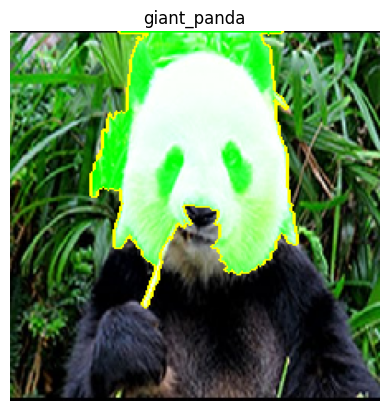

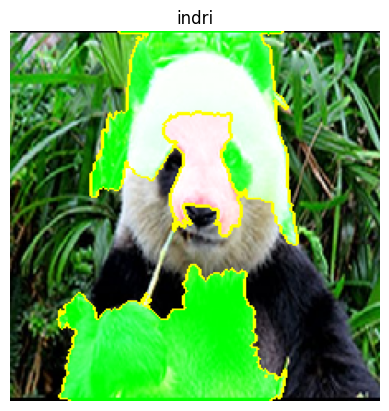

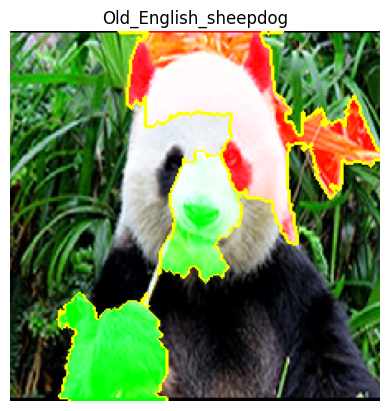

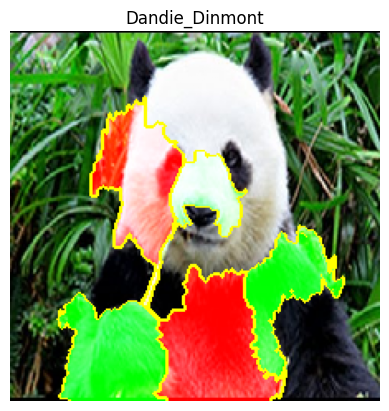

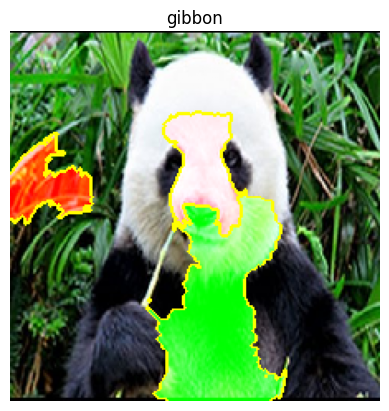

In [93]:
for i in range(len(decode_mn_panda)):
    generate_prediction_sample(exp_mn_panda, exp_mn_panda.top_labels[i], class_name = decode_mn_panda[i][1]) 

First class is predicted correctly, but all others are wrong and sometimes very far from reality.
For the panda class, the ROI is almost the full head which is distinctable from other animals.
For other classes like Dandie Dinmont, only a small portion of the head is consider joined with a small portion of the body.
For the Gibbon class, the ROI is quite similar to the panda class but the mouth and nose are included which might be the discriminating criterias for this class. 

Let's display the score of each class to get a better understanding of the misclassification done by the MobileNet network.

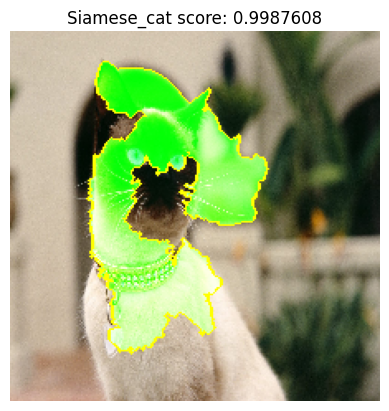

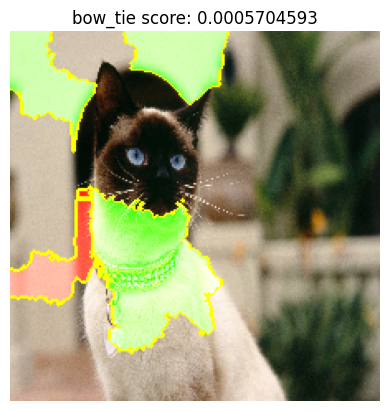

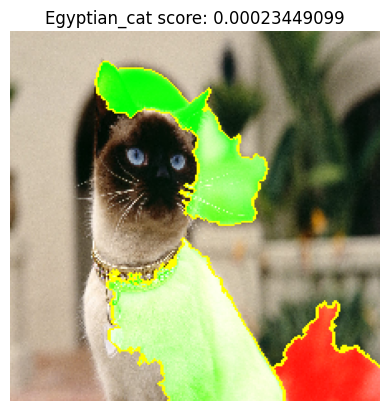

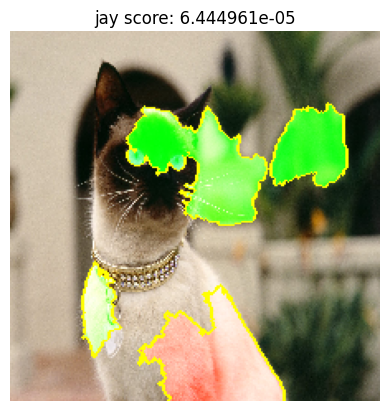

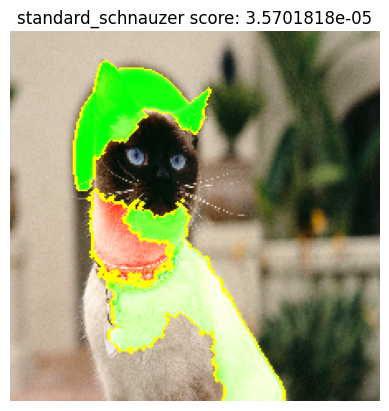

In [94]:
for i in range(len(decode_mn_cat)):
    generate_prediction_sample(exp_mn_cat, exp_mn_cat.top_labels[i], 
                    class_name = decode_mn_cat[i][1] + " score: " + decode_mn_cat[i][2].astype("str"))

We see that there is no misclassification as the scores are below 1 % chance for classes 2, 3, 4 and 5.

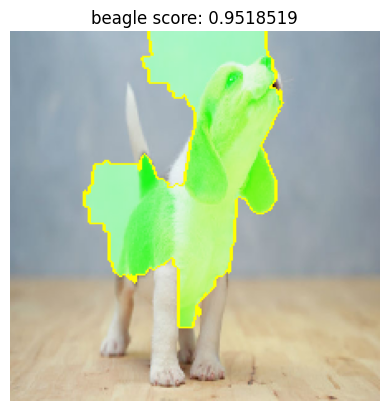

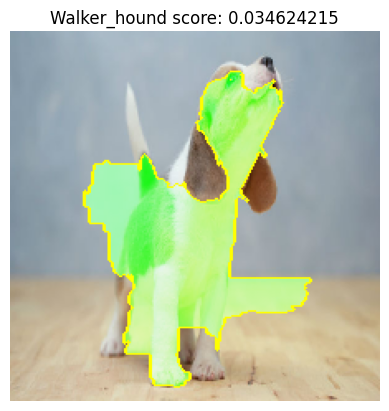

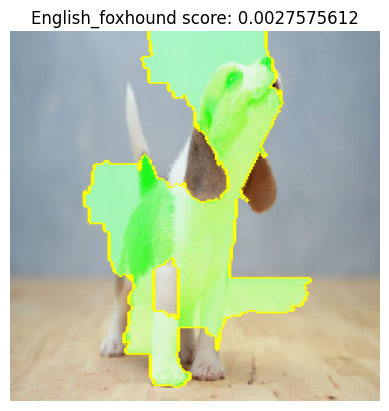

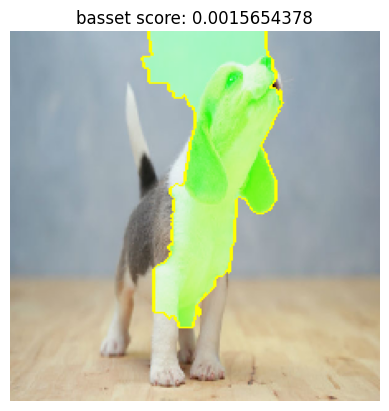

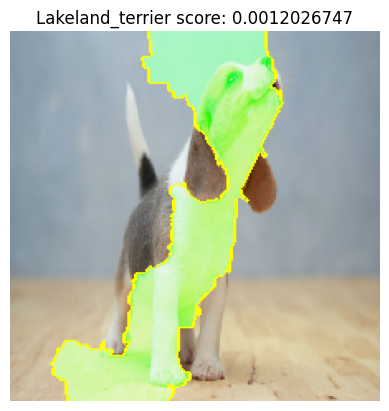

In [95]:
for i in range(len(decode_mn_dog)):
    generate_prediction_sample(exp_mn_dog, exp_mn_dog.top_labels[i], 
                        class_name = decode_mn_dog[i][1] + " score: " + decode_mn_dog[i][2].astype("str")) 

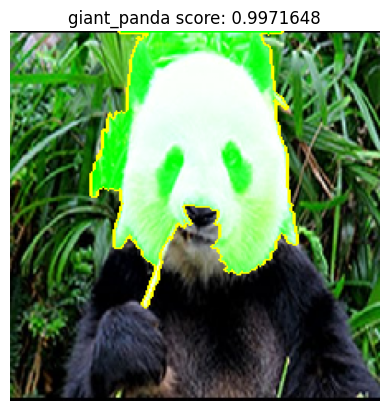

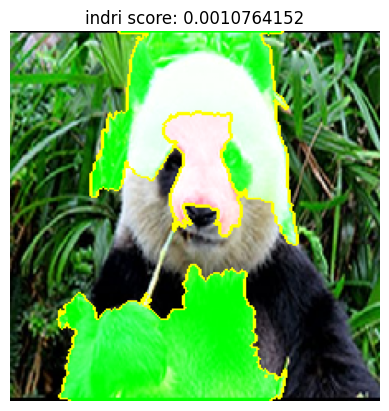

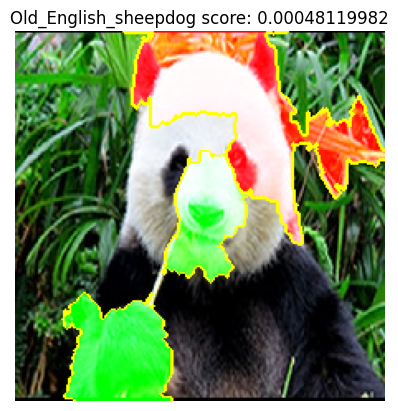

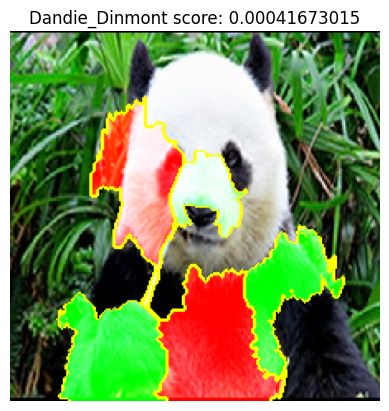

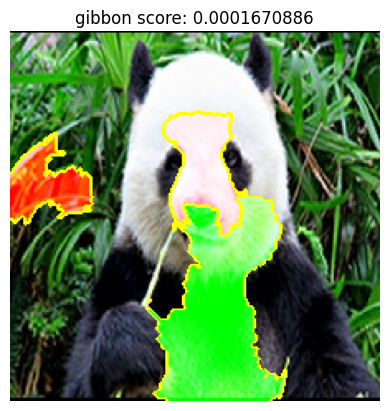

In [96]:
for i in range(len(decode_mn_panda)):
    generate_prediction_sample(exp_mn_panda, exp_mn_panda.top_labels[i], 
            class_name = decode_mn_panda[i][1] + " score: " + decode_mn_panda[i][2].astype("str"))

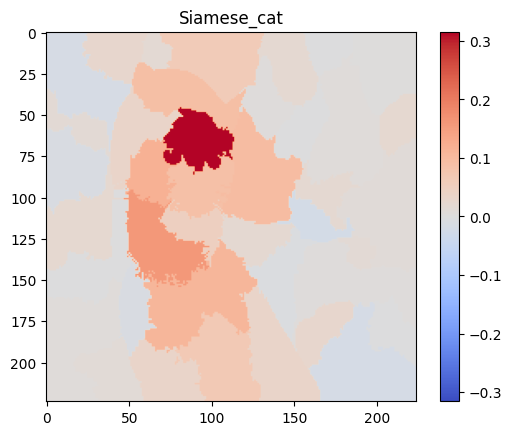

In [68]:
explanation_heatmap(exp_mn_cat, exp_mn_cat.top_labels[0], class_name = decode_mn_cat[0][1])

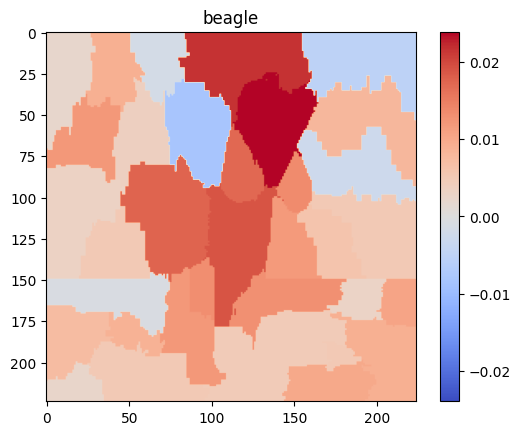

In [69]:
explanation_heatmap(exp_mn_dog, exp_mn_dog.top_labels[0], class_name = decode_mn_dog[0][1])

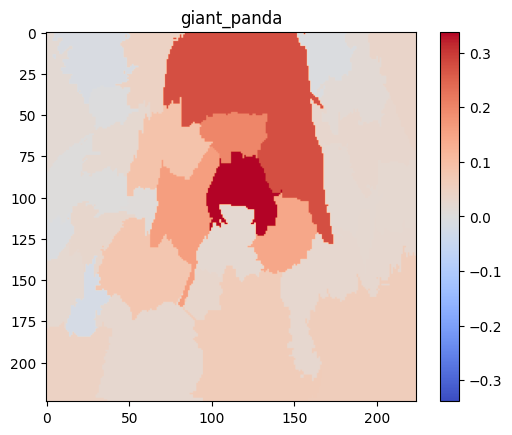

In [97]:
explanation_heatmap(exp_mn_panda, exp_mn_panda.top_labels[0], class_name = decode_mn_panda[0][1])